<font size="6">Projektabgabe im Modul "Python for Data Science"</font>

Um die bestmögliche User Experience mit diesem Notebook zu erhalten, empfehlen wir die Aktivierung der Funktion „Table of Content“ Extension. Diese ist auch in der HTML Version enthalten.
Das gesamte Projekt, sowie dazugehörige Datensätze, können im folgenden GitHub-Folder, oder im lokalen ZIP-Verzeichnis, aufgerufen werden: https://github.com/andreashrb/Python_for_DS_Project.

# Abstract

Immer wieder wird die Kriminalität in Deutschland in Medien und Gesellschaft thematisiert und Brennpunkte beleuchtet. Teilweise ist jedoch nicht hinreichend geklärt, welche Einflussfaktoren auf eine hohe Kriminalitätsrate oder bestimmte Straftaten wirken. 
Das Ziel dieses explorativen Python Projekts ist es, anhand der Kriminalitätsstatistik des Jahres 2020 , jährlich bereitgestellt durch das Bundeskriminalamt, mögliche Einflussfaktoren und Abhängigkeiten zur Kriminalitätsrate auf Kreisgebietsebene (der Bundesrepublik Deutschland) aus gesellschaftlicher und sozioökonomischer Sicht zu betrachten und zu bewerten.
Die Data Preparation, d.h. Einlesen von Datensätzen und Aufbereitung sowie Zusammenführung zu einem zentralen Datensatz, wurde ausgegliedert und ist in jeweils eigenen Juypter Notebooks im lokalen ZIP-Verzeichnis oder im obigen, verlinkten GitHub-Folder zu finden.

Folgende Jupyter-Notebooks (im Ordner "interim_result" des o.g. GitHub-Folder) beinhalten die gesamten Schritte der, der Data Exploration vorangegangenen, Data Preparation:

- Starter Jupyter
- Data Preparation_Sebastian
- Data Preparation_Andreas
- Data Merging

In [32]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import folium
import matplotlib.patches as mpatches

# Importieren des vorbereiteten Datensatzes

In [33]:
# Einlesen des Kriminalstatistik-Datensatzes
kriminalstatistik = pd.read_csv('https://raw.githubusercontent.com/andreashrb/Python_for_DS_Project/main/interim_result/Kriminalstatistik_final.csv')
kriminalstatistik = kriminalstatistik.drop('Unnamed: 0', axis = 1)

df = kriminalstatistik

In [34]:
kriminalstatistik.head()

,Kreis_ID,Straftat_Cluster,Stadt-/Landkreis,Anzahl erfasste Faelle,Haeufigkeitszahl,"erfasste Faelle, davon Versuche - Anzahl",mit Schusswaffe gedroht,mit Schusswaffe geschossen,Auffklaerung - Anzahl Faelle,Tatverdaechtige insgesamt,...,Anteil Ausländer 6 bis unter 15 Jahre,Anteil Auländer 15 bis unter 65 Jahre,Anteil Ausländer 65 Jahre und älter,Anteil Ausländer Aufenthaltsdauer unter 2 Jahre,Anteil Ausländer Aufenthaltsdauer 2 bis unter 10 Jahre,Anteil Ausländer Aufenthaltsdauer 10 bis unter 25 Jahre,Anteil Ausländer Aufenthaltsdauer 25 Jahre und mehr,Bundesland_ID,Bundesland,Kriminalitätsrate
0,1001,Beförderungserschleichung,Flensburg,57,63,0,0,0,56,56,...,7.9,77.2,7.4,17.4,57.5,12.9,12.1,1,Schleswig-Holstein,0.000634
1,1001,"Begünstigung, Strafvereitelung, Hehlerei, Geld...",Flensburg,25,28,0,0,0,24,27,...,7.9,77.2,7.4,17.4,57.5,12.9,12.1,1,Schleswig-Holstein,0.000278
2,1001,Betrug,Flensburg,797,884,74,0,0,585,442,...,7.9,77.2,7.4,17.4,57.5,12.9,12.1,1,Schleswig-Holstein,0.008862
3,1001,Brandstiftung,Flensburg,28,31,4,0,0,12,12,...,7.9,77.2,7.4,17.4,57.5,12.9,12.1,1,Schleswig-Holstein,0.000311
4,1001,Cyberkriminalität,Flensburg,172,191,36,0,0,84,60,...,7.9,77.2,7.4,17.4,57.5,12.9,12.1,1,Schleswig-Holstein,0.001913


In [35]:
# Speichern aller Spalten des Datensatzes als Liste
columns=list(kriminalstatistik.columns)

In [36]:
# Prüfen der Datentypen für jede Spalten

for i in columns:
    print(i, "hat den Datentypen", kriminalstatistik[i].dtypes)

Kreis_ID hat den Datentypen int64
Straftat_Cluster hat den Datentypen object
Stadt-/Landkreis hat den Datentypen object
Anzahl erfasste Faelle hat den Datentypen int64
Haeufigkeitszahl hat den Datentypen int64
erfasste Faelle, davon Versuche - Anzahl hat den Datentypen int64
mit Schusswaffe gedroht hat den Datentypen int64
mit Schusswaffe geschossen hat den Datentypen int64
Auffklaerung - Anzahl Faelle hat den Datentypen int64
Tatverdaechtige insgesamt hat den Datentypen int64
Tatverdaechtige - maennlich hat den Datentypen int64
Tatverdaechtige - weiblich hat den Datentypen int64
Nichtdeutsche Tatverdaechtige - Anzahl hat den Datentypen int64
erfasste Faelle, davon Versuche - Anteil in % hat den Datentypen float64
Aufklaerungsquote in % hat den Datentypen float64
Nichtdeutsche Tatverdaechtige - Anteil in % an der Gesamtzahl hat den Datentypen float64
Berufl. Absolventen Anzahl insgesamt hat den Datentypen int64
Berufl. Absolventen Anzahl weiblich hat den Datentypen int64
Berufl. Absolv

# Deskriptive Statistik
Zum Einstieg in die weitere Analyse und Datenexploration sollen zunächst einige deskriptive Statistiken betrachtet werden.
Aufgrund der Vielzahl der Spalten des Datensatzes werden einzelne, in sich geschlossene Bestandteile des Gesamtdatensatzes, separat voneinander deskriptiv analysiert.

## Numerische Spalten

In [37]:
# Vorbereitung der Spaltenlisten zur partiellen Betrachtung der deskriptiven Statistiken
kriminal_spalten = ['Kreis_ID',
 'Straftat_Cluster',
 'Stadt-/Landkreis',
 'Anzahl erfasste Faelle',
 'Haeufigkeitszahl',
 'erfasste Faelle, davon Versuche - Anzahl',
 'mit Schusswaffe gedroht',
 'mit Schusswaffe geschossen',
 'Auffklaerung - Anzahl Faelle',
 'Tatverdaechtige insgesamt',
 'Tatverdaechtige - maennlich',
 'Tatverdaechtige - weiblich',
 'Nichtdeutsche Tatverdaechtige - Anzahl',
 'erfasste Faelle, davon Versuche - Anteil in %',
 'Aufklaerungsquote in %',
 'Nichtdeutsche Tatverdaechtige - Anteil in % an der Gesamtzahl',
 'Bundesland',
 'Kriminalitätsrate']

erwerbstätige_einkommen = ['Verfügbares Einkommen pro Einwohner',
 'Erwerbstätige im Jahresdurchschnitt Insgesamt 1000',
 'Erwerbstätige im Jahresdurchschnitt Land- und Forstwirtschaft, Fischerei (A) 1000',
 'Erwerbstätige im Jahresdurchschnitt Produzierendes Gewerbe ohne Baugewerbe (B-E) 1000',
 'Erwerbstätige im Jahresdurchschnitt Verarbeitendes Gewerbe (C) 1000',
 'Erwerbstätige im Jahresdurchschnitt Baugewerbe (F) 1000',
 'Erwerbstätige im Jahresdurchschnitt Handel,Verkehr,Gastgewerbe,Informa-/Kommunikation 1000',
 'Erwerbstätige im Jahresdurchschnitt Fin-,Vers.-,Unt.-dienstl.,Grundst.-/Wohnungswesen 1000',
 'Erwerbstätige im Jahresdurchschnitt öffentl. u. sonst. Dienstl.,Erziehung, Gesundheit 1000']

migration1 = ['Anteil der Ausländer insgesamt an der Bevölkerung insgesamt',
 'Anteil der Ausländer männlich an der Bevölkerung männlich',
 'Anteil der Ausländer weiblich an der Bevölkerung weiblich',
 'Anteil der Ausländer unter 6 Jahren an der Bevölkerung unter 6 Jahren',
 'Anteil der Ausländer männlich unter 6 Jahren an der Bevölkerung männlich unter 6 Jahren',
 'Anteil der Ausländer weiblich unter 6 Jahren an der Bevölkerung weiblich unter 6 Jahren',
 'Anteil der Ausländer, 6 bis unter 15 Jahre an der Bevölkerung, 6 bis unter 15 Jahre',
 'Anteil der Ausländer männlich, 6 bis unter 15 Jahre an der Bevölkerung männlich, 6 bis unter 15 Jahre',
 'Anteil der Ausländer weiblich, 6 bis unter 15 Jahre an der Bevölkerung weiblich, 6 bis unter 15 Jahre',
 'Anteil der Ausländer, 15 bis unter 65 Jahre an der Bevölkerung, 15 bis unter 65 Jahre',
 'Anteil der Ausländer männlich, 15 bis unter 65 Jahre an der Bevölkerung männlich, 15 bis unter 65 Jahre',
 'Anteil der Ausländer weiblich, 15 bis unter 65 Jahre an der Bevölkerung weiblich, 15 bis unter 65 Jahre',
 'Anteil der Ausländer, 65 Jahre und älter an der Bevölkerung, 65 Jahre und älter',
 'Anteil der Ausländer männlich, 65 Jahre und älter an der Bevölkerung männlich, 65 Jahre und älter',
 'Anteil der Ausländer weiblich, 65 Jahre und älter an der Bevölkerung weiblich, 65 Jahre und älter',
 'Beschäftigungsquoten insgesamt',
 'Beschäftigungsquoten Ausländer',
 'Arbeitslosenquoten von Ausländern (eingeschränkte Bezugsgröße) (nach Mig-Monitor)',
 'Anteil Arbeitsuchender (Flucht und Migration) an allen Arbeitsuchenden',
 'Anteil sozialversicherungspflichtig beschäftigter Ausländer',
 'Anteil der Ausländer aus den Gastarbeiter-Anwerbestaaten an allen Ausländern',
 'Anteil der EU-Ausländer an allen Ausländern',
 'Anteil der Ausländer aus den seit 2004 der EU beigetretenen Staaten (EU-Osterweiterung)',
 'Anteil der Nicht-EU-Ausländer an allen Ausländern',
 'Anteil Ausländer unter 6 Jahre',
 'Anteil Ausländer 6 bis unter 15 Jahre',
 'Anteil Auländer 15 bis unter 65 Jahre',
 'Anteil Ausländer 65 Jahre und älter',
 'Anteil Ausländer Aufenthaltsdauer unter 2 Jahre',
 'Anteil Ausländer Aufenthaltsdauer 2 bis unter 10 Jahre',
 'Anteil Ausländer Aufenthaltsdauer 10 bis unter 25 Jahre',
 'Anteil Ausländer Aufenthaltsdauer 25 Jahre und mehr']

migration2 = [ 'Bevölkerung insgesamt',
 'Bevölkerung insgesamt männlich',
 'Bevölkerung insgesamt weiblich',
 'Ausländer insgesamt',
 'Ausländer insgesamt männlich',
 'Ausländer insgesamt weiblich',
 'Bevölkerung insgesamt unter 6 Jahren',
 'Bevölkerung männlich, unter 6 Jahren',
 'Bevölkerung weiblich, unter 6 Jahren',
 'Bevölkerung Deutsche insgesamt unter 6 Jahren',
 'Bevölkerung Deutsche männlich unter 6 Jahren',
 'Bevölkerung Deutsche weiblich unter 6 Jahren',
 'Bevölkerung Ausländer insgesamt unter 6 Jahren',
 'Bevölkerung Ausländer männlich unter 6 Jahren',
 'Bevölkerung Ausländer weiblich unter 6 Jahren',
 'Bevölkerung insgesamt, 6 bis unter 15 Jahren',
 'Bevölkerung männlich,, 6 bis unter 15 Jahren',
 'Bevölkerung weiblich,, 6 bis unter 15 Jahren',
 'Bevölkerung Deutsche insgesamt, 6 bis unter 15 Jahren',
 'Bevölkerung Deutsche männlich, 6 bis unter 15 Jahren',
 'Bevölkerung Deutsche weiblich, 6 bis unter 15 Jahren',
 'Bevölkerung Ausländer insgesamt, 6 bis unter 15 Jahren',
 'Bevölkerung Ausländer männlich, 6 bis unter 15 Jahren',
 'Bevölkerung Ausländer weiblich, 6 bis unter 15 Jahren',
 'Bevölkerung insgesamt, 15 bis unter 65 Jahren',
 'Bevölkerung männlich,, 15 bis unter 65 Jahren',
 'Bevölkerung weiblich,, 15 bis unter 65 Jahren',
 'Bevölkerung Deutsche insgesamt, 15 bis unter 65 Jahren',
 'Bevölkerung Deutsche männlich, 15 bis unter 65 Jahren',
 'Bevölkerung Deutsche weiblich, 15 bis unter 65 Jahren',
 'Bevölkerung Ausländer insgesamt, 15 bis unter 65 Jahren',
 'Bevölkerung Ausländer männlich, 15 bis unter 65 Jahren',
 'Bevölkerung Ausländer weiblich, 15 bis unter 65 Jahren',
 'Bevölkerung insgesamt, 65 Jahre und älter',
 'Bevölkerung männlich,, 65 Jahre und älter',
 'Bevölkerung weiblich,, 65 Jahre und älter',
 'Bevölkerung Deutsche insgesamt, 65 Jahre und älter',
 'Bevölkerung Deutsche männlich, 65 Jahre und älter',
 'Bevölkerung Deutsche weiblich, 65 Jahre und älter',
 'Bevölkerung Ausländer insgesamt, 65 Jahre und älter',
 'Bevölkerung Ausländer männlich, 65 Jahre und älter',
 'Bevölkerung Ausländer weiblich, 65 Jahre und älter',]

arbeitslosen_numerisch = ['Arbeitslose Anzahl insgesamt', 
'Arbeitslose Anzahl Ausländer',
'Arbeitslose Anzahl Schwerbehindert',
'Arbeitslose Anzahl Alter zwischen 15 bis unter 20 Jahre',
'Arbeitslose Anzahl Alter zwischen 20 bis unter 55 Jahre',
'Arbeitslose Anzahl Alter zwischen 55 bis unter 65 Jahre',
'Arbeitslose Anzahl Langzeitarbeitslos']

arbeitslosen_quoten = ['Arbeitslosenquote Prozent bezogen auf abhängige zivile Erwerbspersonen',
'Arbeitslosenquote Prozent bezogen auf alle zivilen Erwerbspersonen']

wahl_numerisch = ['Wahlbeteiligung Prozent',
'Wahlberechtige Anzahl',
'Gültige Zweitstimmen Parteien CDU/CSU Anzahl',
'Gültige Zweitstimmen Parteien SPD Anzahl',
'Gültige Zweitstimmen Parteien GRÜNE Anzahl',
'Gültige Zweitstimmen Parteien FDP Anzahl',
'Gültige Zweitstimmen Parteien DIE LINKE Anzahl',
'Gültige Zweitstimmen Parteien AfD Anzahl']

### Deskriptive Statistiken - Kriminaldatensatz

In [38]:
# Anzeige deskriptiver Statistiken des Kriminaldatensatzes
kriminalstatistik[kriminal_spalten].describe()

,Kreis_ID,Anzahl erfasste Faelle,Haeufigkeitszahl,"erfasste Faelle, davon Versuche - Anzahl",mit Schusswaffe gedroht,mit Schusswaffe geschossen,Auffklaerung - Anzahl Faelle,Tatverdaechtige insgesamt,Tatverdaechtige - maennlich,Tatverdaechtige - weiblich,Nichtdeutsche Tatverdaechtige - Anzahl,"erfasste Faelle, davon Versuche - Anteil in %",Aufklaerungsquote in %,Nichtdeutsche Tatverdaechtige - Anteil in % an der Gesamtzahl,Kriminalitätsrate
count,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000
mean,8305.947631,558.056790,229.427114,38.079914,0.620154,0.433689,341.332124,304.123328,239.132850,64.990478,124.941056,11.026075,76.873145,33.815176,0.002297
std,3757.886651,2204.690555,356.238570,200.923893,4.501925,2.087278,1119.039511,898.371520,667.882731,252.384706,596.463124,18.345268,26.803321,21.393318,0.003570
min,1001.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5762.000000,44.000000,31.000000,0.000000,0.000000,0.000000,34.000000,34.000000,28.000000,5.000000,9.000000,0.000000,61.874496,20.000000,0.000315
50%,8235.000000,145.000000,93.000000,5.000000,0.000000,0.000000,104.000000,104.500000,83.000000,18.000000,31.000000,4.005013,88.763017,30.493963,0.000932
75%,9676.000000,474.000000,289.000000,26.000000,0.000000,0.000000,309.000000,296.000000,237.750000,54.000000,89.000000,13.657387,97.995798,42.857143,0.002888
max,16077.000000,103622.000000,8301.000000,8954.000000,263.000000,99.000000,37145.000000,31358.000000,18698.000000,13023.000000,31257.000000,100.000000,150.000000,100.000000,0.083913


Erkenntnisse aus der deskriptiven Statistik:
1. Über alle Kreise und Straftatdelikte hinweg liegt die durchschnittliche Anzahl erfasster Straftaten/Fälle bei 558, während der Median bei 145 liegt. Somit gibt es einige wenige Ausreißer nach rechts (rechtsschiefe Verteilung). Die Spanne reicht von 0 bis 103.622 im Maximum.
2. Von den durchschnittlich 558 erfassten Fällen handelt es sich durchschnittlich um 38 Versuche. Auch hierbei handelt es sich erneut um eine stark rechtsschiefe Verteilung (Median = 5, Max = 8.954).
3. Bei 558 Fällen (im Durchschnitt über alle Straftatdelikte und Kreise) liegt der durchschnittliche Einsatz von Schusswaffen (sowohl bedroht, als auch geschossen) bei < 1. In weniger als einem von 558 Fällen wird also durchschnittlich eine Schusswaffe benutzt.
4. Durchschnittlich 558 Straftaten werden von durchschnittlich 304 verschiedenen Tatverdächtigen begangen. Davon sind durchschnittlich lediglich 55 weibliche Tatverdächtige und 239 männliche Tatverdächtige erfasst worden. Davon Nichtdeutsche Tatverdächtige waren durchschnittlich 125.
5. Durchschnittlich 11% aller erfassten Fälle waren lediglich Versuche ohne Vollendung der Straftat.
6. Der Anteil Nichtdeutscher Tatverdächtiger liegt durchschnittlich beiu 33,82 %. Hierbei handelt es sich um eine nur leicht rechtsschiefe Verteilung (Median = 30,49%). Im Vergleich zu vielen anderen hier gelisteten Informationen entspricht dies am ehesten einer Normalverteilung

### Deskriptive Statistiken - Erwerbstätigen- & Einkommensdaten

In [39]:
kriminalstatistik[erwerbstätige_einkommen].describe()

,Verfügbares Einkommen pro Einwohner,Erwerbstätige im Jahresdurchschnitt Insgesamt 1000,"Erwerbstätige im Jahresdurchschnitt Land- und Forstwirtschaft, Fischerei (A) 1000",Erwerbstätige im Jahresdurchschnitt Produzierendes Gewerbe ohne Baugewerbe (B-E) 1000,Erwerbstätige im Jahresdurchschnitt Verarbeitendes Gewerbe (C) 1000,Erwerbstätige im Jahresdurchschnitt Baugewerbe (F) 1000,"Erwerbstätige im Jahresdurchschnitt Handel,Verkehr,Gastgewerbe,Informa-/Kommunikation 1000","Erwerbstätige im Jahresdurchschnitt Fin-,Vers.-,Unt.-dienstl.,Grundst.-/Wohnungswesen 1000","Erwerbstätige im Jahresdurchschnitt öffentl. u. sonst. Dienstl.,Erziehung, Gesundheit 1000"
count,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000
mean,23542.790524,112.893516,1.492519,20.848628,19.346883,6.365337,29.006733,19.397007,35.780549
std,2794.190575,155.079078,1.323184,18.073333,16.856762,6.132916,44.040679,40.196601,53.441008
min,17015.000000,20.000000,0.000000,1.600000,1.000000,0.800000,4.100000,2.100000,6.600000
25%,21677.000000,49.600000,0.500000,9.500000,8.600000,3.300000,12.100000,6.100000,15.500000
50%,23412.000000,74.700000,1.200000,14.900000,13.500000,5.000000,18.600000,9.800000,23.300000
75%,25151.000000,125.800000,2.100000,26.100000,24.200000,7.800000,31.000000,19.100000,39.300000
max,42275.000000,2066.700000,8.200000,136.900000,116.800000,90.400000,547.000000,495.300000,796.400000


Erkenntnisse aus der deskriptiven Statistik:
1. Das durchschnittliche verfügbare Einkommen über alle Kreise hinweg liegt bei 23.542€. Der Median liegt bei 23.412€. Somit handelt es sich um eine beinahe Normalverteilung des verfügbaren Einkommens über alle Kreise. Das kleinste durchschnittliche verfügare Einkommen liegt bei 17.015€, während das maximale verfügbare Einkommen pro Kopf bei 42.275€ liegt. Damit liegt das höchste Einkommen ca. 2,5-fach höher als das niedrigste verfügbare Einkommen pro Kopf.

2. Die jahresdurchschnittliche Anzahl erwerbstätiger Personen über alle Kreise hinweg beträgt 112.894. Dass es sich auch hierbei um eine rechtsschiefe Verteilung handelt, wird deutlich, wenn man sich den Median von 74.700 erwerbstätigen Personen anschaut. Hierbei handelt es sich allerdings um absolute Werte, deren Verteilung auch in einer unterschiedlichen Bevölkerungsanzahl in verschiedenen Kreisen begründet sein kann.

### Deskriptive Statistiken - Migrationsdatensatz Teil 1

In [40]:
kriminalstatistik[migration1].describe()

,Anteil der Ausländer insgesamt an der Bevölkerung insgesamt,Anteil der Ausländer männlich an der Bevölkerung männlich,Anteil der Ausländer weiblich an der Bevölkerung weiblich,Anteil der Ausländer unter 6 Jahren an der Bevölkerung unter 6 Jahren,Anteil der Ausländer männlich unter 6 Jahren an der Bevölkerung männlich unter 6 Jahren,Anteil der Ausländer weiblich unter 6 Jahren an der Bevölkerung weiblich unter 6 Jahren,"Anteil der Ausländer, 6 bis unter 15 Jahre an der Bevölkerung, 6 bis unter 15 Jahre","Anteil der Ausländer männlich, 6 bis unter 15 Jahre an der Bevölkerung männlich, 6 bis unter 15 Jahre","Anteil der Ausländer weiblich, 6 bis unter 15 Jahre an der Bevölkerung weiblich, 6 bis unter 15 Jahre","Anteil der Ausländer, 15 bis unter 65 Jahre an der Bevölkerung, 15 bis unter 65 Jahre",...,Anteil der Ausländer aus den seit 2004 der EU beigetretenen Staaten (EU-Osterweiterung),Anteil der Nicht-EU-Ausländer an allen Ausländern,Anteil Ausländer unter 6 Jahre,Anteil Ausländer 6 bis unter 15 Jahre,Anteil Auländer 15 bis unter 65 Jahre,Anteil Ausländer 65 Jahre und älter,Anteil Ausländer Aufenthaltsdauer unter 2 Jahre,Anteil Ausländer Aufenthaltsdauer 2 bis unter 10 Jahre,Anteil Ausländer Aufenthaltsdauer 10 bis unter 25 Jahre,Anteil Ausländer Aufenthaltsdauer 25 Jahre und mehr
count,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,...,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000
mean,11.056110,11.926434,10.206733,13.314713,13.400998,13.222693,11.510723,11.719451,11.283541,13.167332,...,30.098005,55.787781,6.507232,8.437905,77.326683,7.728429,13.660848,49.130424,17.126434,20.086534
std,5.454971,5.667512,5.266322,5.331882,5.357355,5.340258,4.708562,4.771816,4.680934,6.290253,...,10.218340,10.981743,1.399392,1.716139,2.425453,2.757597,3.981295,7.522011,2.714988,9.363759
min,2.200000,2.600000,1.900000,3.400000,3.400000,3.100000,2.600000,2.700000,2.500000,3.000000,...,10.200000,22.300000,3.400000,4.500000,70.200000,1.500000,6.700000,31.100000,7.800000,3.400000
25%,7.000000,7.600000,6.200000,9.500000,9.700000,9.400000,8.200000,8.300000,8.000000,8.300000,...,22.100000,48.100000,5.500000,7.200000,75.800000,5.800000,10.800000,43.100000,15.600000,13.300000
50%,10.200000,11.100000,9.300000,12.500000,12.500000,12.600000,11.000000,11.200000,10.700000,12.200000,...,28.700000,55.500000,6.300000,8.200000,77.300000,8.100000,12.700000,48.100000,17.100000,21.000000
75%,14.400000,15.300000,13.500000,16.400000,16.400000,16.300000,14.300000,14.500000,14.300000,17.100000,...,36.500000,63.800000,7.400000,9.500000,79.100000,9.800000,15.900000,54.600000,18.700000,27.100000
max,36.900000,38.100000,35.800000,30.200000,30.400000,30.700000,29.600000,30.300000,28.900000,42.400000,...,66.500000,80.900000,12.900000,14.600000,83.400000,15.700000,30.000000,69.200000,31.900000,44.700000


Erkenntnisse aus der deskriptiven Statistik:
1. Der durchschnittliche Anteil ausländischer Bürger an der Gesamtbevölkerung liegt über alle Kreise hinweg bei ca. 11%. Im Median beträgt der Ausländeranteil über alle Kreise hinweg 10,2%, was einer annähernden Normalverteilung entspricht. Die Spanne des durchschnittlichen Ausländeranteils reicht von 2,2% bis 36,9%.

2. Der gewichtete Ausländeranteil nach Geschlechtern geht durchschnittlich leicht zu gunsten der männlichen Ausländer aus. Durchschnittlich, über alle Kreise hinweg, beträgt der Anteil männlicher Ausländer an der männlichen Bevölkerung ca. 11,93%, während es bei den weiblichen Ausländern ca. 10,21% sind. Die Spanne der Werte ist bei beiden Geschlechtergruppen ähnlich, ebenso ist die Verteilung der Werte annähernd normalverteilt - die weibliche Verteilung etwas rechtsschiefer.

3. Lediglich durchschnittlich 30% der Ausländer kommen aus EU-Staaten. Rund durchschnittlich 56% aller Ausländer stammen aus Nicht-EU-Staaten. Die Verteilung der Nicht-EU-Ausländer ist (über alle betrachteten Kreise hinweg) fast vollständig normalverteilt. Wohingegen der Anteil der Ausländer aus EU-Staaten über alle Kreise hinweg leicht rechtsschief verteilt ist.

### Deskriptive Statistiken - Migrationsdatensatz Teil 2

In [41]:
kriminalstatistik[migration2].describe()

,Bevölkerung insgesamt,Bevölkerung insgesamt männlich,Bevölkerung insgesamt weiblich,Ausländer insgesamt,Ausländer insgesamt männlich,Ausländer insgesamt weiblich,Bevölkerung insgesamt unter 6 Jahren,"Bevölkerung männlich, unter 6 Jahren","Bevölkerung weiblich, unter 6 Jahren",Bevölkerung Deutsche insgesamt unter 6 Jahren,...,"Bevölkerung Ausländer weiblich, 15 bis unter 65 Jahren","Bevölkerung insgesamt, 65 Jahre und älter","Bevölkerung männlich,, 65 Jahre und älter","Bevölkerung weiblich,, 65 Jahre und älter","Bevölkerung Deutsche insgesamt, 65 Jahre und älter","Bevölkerung Deutsche männlich, 65 Jahre und älter","Bevölkerung Deutsche weiblich, 65 Jahre und älter","Bevölkerung Ausländer insgesamt, 65 Jahre und älter","Bevölkerung Ausländer männlich, 65 Jahre und älter","Bevölkerung Ausländer weiblich, 65 Jahre und älter"
count,8.822000e+03,8.822000e+03,8.822000e+03,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,...,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000
mean,2.073692e+05,1.023105e+05,1.050586e+05,26396.640898,13907.182045,12489.458853,11857.586035,6084.234414,5773.351621,10199.216958,...,9461.635910,45565.177057,20006.301746,25558.875312,43232.182045,18904.466334,24327.715711,2332.995012,1101.835411,1231.159601
std,2.447168e+05,1.201289e+05,1.246032e+05,49402.015945,25364.303328,24053.133457,15147.790673,7774.892630,7373.307616,12584.539285,...,18796.808257,47278.970550,20356.017833,26934.590469,43458.971168,18618.599589,24853.441366,4527.069134,2086.318184,2443.635730
min,3.400100e+04,1.684000e+04,1.716100e+04,2071.000000,1162.000000,873.000000,1463.000000,763.000000,700.000000,1220.000000,...,668.000000,8080.000000,3535.000000,4545.000000,7810.000000,3406.000000,4404.000000,47.000000,29.000000,17.000000
25%,1.034710e+05,5.143200e+04,5.229400e+04,8167.000000,4463.000000,3724.000000,5684.000000,2918.000000,2776.000000,4933.000000,...,2699.000000,24395.000000,10720.000000,13489.000000,23428.000000,10208.000000,12884.000000,456.000000,233.000000,239.000000
50%,1.551170e+05,7.633800e+04,7.825900e+04,14218.000000,7662.000000,6515.000000,8778.000000,4467.000000,4293.000000,7598.000000,...,4805.000000,34141.000000,14900.000000,18912.000000,32578.000000,14297.000000,18383.000000,1064.000000,502.000000,563.000000
75%,2.403710e+05,1.181490e+05,1.226240e+05,28759.000000,14824.000000,13511.000000,13253.000000,6833.000000,6503.000000,11665.000000,...,9956.000000,55282.000000,24073.000000,31089.000000,51521.000000,22705.000000,29417.000000,2566.000000,1189.000000,1348.000000
max,3.664088e+06,1.802038e+06,1.862050e+06,717630.000000,369740.000000,347890.000000,227888.000000,117082.000000,110806.000000,187521.000000,...,275278.000000,705928.000000,303570.000000,402358.000000,655330.000000,281189.000000,374141.000000,50598.000000,22381.000000,28217.000000


Erkentnnise aus der deskriptiven Statistik:

1. Die durchschnittliche Bevölkerungsanzahl pro Kreis beträgt 207.369. Eine starke rechtsschiefe Verteilung wird untermauert durch den Median, der hier bei 155.117 liegt. Es scheint also einige wenige große, stark bevölkerte, Kreise zu geben, die den Mittelwert "nach rechts" schieben.

2. Der Anteil der weiblichen und männlichen Bevölkerungsanteile ist ziemlich gleichverteilt. Durchschnittlich, über alle Kreise hinweg, beträgt der weibliche Bevölkerungsanteil ca. 105.059, während der männliche Bevölkerungsanteil bei 102.311 liegt.

3. Die durchschnittliche Anzahl an Ausländern pro Kreis beträgt 26.397. Davon sind durchschnittlich 13.907 männliche Ausländer und 12.489 weibliche Ausländer. Die männlichen Ausländer haben hier also das leicht höhere Gewicht an der Gesamtzahl der Ausländer an der Gesamtbevölkerung. Beide Geschlechtergruppen der Ausländer sind rechtsschief verteilt, ähnlich, wie die kumulierten Bevölkerungszahlen. Somit unterstreicht dieser Fakt noch einmal die annähernde Normalverteilung beim Ausländeranteil in der Gesamtbevölkerung über die einzelnen Kreise hinweg.

### Deskriptive Statistiken - Arbeitslosendatensatz

In [42]:
kriminalstatistik[arbeitslosen_numerisch].describe()

,Arbeitslose Anzahl insgesamt,Arbeitslose Anzahl Ausländer,Arbeitslose Anzahl Schwerbehindert,Arbeitslose Anzahl Alter zwischen 15 bis unter 20 Jahre,Arbeitslose Anzahl Alter zwischen 20 bis unter 55 Jahre,Arbeitslose Anzahl Alter zwischen 55 bis unter 65 Jahre,Arbeitslose Anzahl Langzeitarbeitslos
count,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000
mean,6721.835411,1984.301746,423.194514,123.423940,641.842893,1402.985037,2036.810474
std,11883.407438,4415.379877,575.250231,227.922457,1018.855955,1945.776329,3399.700295
min,933.000000,119.000000,60.000000,17.000000,108.000000,222.000000,161.000000
25%,2445.000000,500.000000,179.000000,49.000000,252.000000,608.000000,563.000000
50%,4103.000000,867.000000,268.000000,79.000000,430.000000,920.000000,1123.000000
75%,7294.000000,1958.000000,445.000000,139.000000,724.000000,1621.000000,2283.000000
max,192644.000000,68444.000000,8175.000000,4042.000000,16567.000000,30771.000000,47345.000000


Erkenntnisse deskriptiv:

1. Die durchschnittliche Anzahl der Arbeitslosen pro Kreis / Stadt liegt bei 6.721 Menschen im Jahr 2020. Der Median von 4.103 zeigt eine deutliche Tendenz in Richtung rechtsschiefer Verteilung. Einige wenige Kreise bzw. Städte mit einer hohen Arbeitslosenzahl verschieben den Mittelwert damit "nach rechts". Dies zeigt auch der extrem Ausreißer von 192.644 Arbeitslosen in einem Kreis.
2. Die durchschnittliche Anzahl der arbeitslosen Arbeitnehmer Deutschlands je Kreis / Stadt mit einem Alter zwischen 55 bis unter dem Renteneintrittsalter von 65 Jahren liegt deutlich über den beiden anderen Altergruppen (1.402).
3. Es stechen außerdem besonders die durchschnittliche Anzahl "Arbeitslose Ausländer" (1.984) und "Arbeitslose Langzeitarbeitslose" hervor. Beide sind in Summe jeweils fast genauso hoch wie die durchschnittliche Arbeitslosenanzahl über die bereits genannten Altersgruppen.

### Deskriptive Statistiken - Bundestagswahl

In [43]:
kriminalstatistik[wahl_numerisch].describe()

,Wahlbeteiligung Prozent,Wahlberechtige Anzahl,Gültige Zweitstimmen Parteien CDU/CSU Anzahl,Gültige Zweitstimmen Parteien SPD Anzahl,Gültige Zweitstimmen Parteien GRÜNE Anzahl,Gültige Zweitstimmen Parteien FDP Anzahl,Gültige Zweitstimmen Parteien DIE LINKE Anzahl,Gültige Zweitstimmen Parteien AfD Anzahl
count,8822.000000,8.822000e+03,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000,8822.000000
mean,76.256608,1.526953e+05,27889.506234,29835.837905,17305.705736,13274.785536,5676.935162,11993.304239
std,4.145167,1.659443e+05,24249.910338,32481.854231,29216.957382,13953.311173,11807.301631,11683.631188
min,63.400000,2.574700e+04,3347.000000,3908.000000,1085.000000,1765.000000,643.000000,1809.000000
25%,74.000000,8.020100e+04,15069.000000,13528.000000,5938.000000,6014.000000,1882.000000,5993.000000
50%,76.500000,1.125130e+05,22260.000000,23058.000000,10181.000000,9800.000000,3321.000000,8958.000000
75%,79.100000,1.846550e+05,33650.000000,35651.000000,19421.000000,16243.000000,6394.000000,14206.000000
max,85.500000,2.468919e+06,289691.000000,428289.000000,408533.000000,165937.000000,209052.000000,153694.000000


Erkenntnisse deskriptiv:

1. Die durchschnittliche Wahlbeteiligung lag deutschlandweit bei 76,25 %. Die höchste Wahlbeteiligung konnte mit 85,5 % gemessen werden. Es liegt eine leicht linksschiefe Verteilung vor, jedoch schon sehr nahe an einer Normalverteilung.
2. Die großen Volksparteien haben wie erwartet die meisten Stimmen für sich gewinnen können. So erzielen CDU/CSU und die SPD im Schnitt ca. 60.000 Stimmen je Kreis / Stadt und erzielen damit knapp 55% aller gültigen Zweitstimmen.
3. Die durchschnittliche Anzahl der Wahlberechtigten beträgt 152.000 Menschen je Kreis / Stadt. Damit sind - bezogen auf die unter 1.1.4 ermittelte durchschnittliche Bevölkerungsanzahl von 207.369 - ca. 73 % der im Schnitt lebenden Menschen eines Kreises zur Teilnahme an der Bundestagswahl berechtigt. 

## Kategoriale Spalten

In [44]:
kategorial_spalten = ['Straftat_Cluster',
 'Stadt-/Landkreis']

In [45]:
kriminalstatistik[kategorial_spalten[0]].nunique()

22

In [46]:
kriminalstatistik[kategorial_spalten[1]].nunique()

380

Erkenntnisse aus den kategorialen Spalten:

Die zwei kategorialen Spalten dieses Datensatzes sind "Straftat_Cluster" und "Stadt-/Landkreis".
Insgesamt werden 22 Straftat Cluster über 380 eindeutige Städte und Landkreise betrachtet.

In [47]:
# Anzeige der eindeutigen Straftatcluster als Liste
list(kriminalstatistik[kategorial_spalten[0]].unique())

['Beförderungserschleichung',
 'Begünstigung, Strafvereitelung, Hehlerei, Geldwäsche',
 'Betrug',
 'Brandstiftung',
 'Cyberkriminalität',
 'Diebstahl (einfach)',
 'Einbruchdiebstahl',
 'Erschleichen von Leistungen',
 'Gewalt',
 'Körperverletzung (einfach)',
 'Körperverletzung (schwer)',
 'Mord, Totschlag, Tötung auf Verlangen',
 'Raub',
 'Rauschgift',
 'Sachbeschädigung',
 'Straftaten gg. Asyl- und Aufenthaltsgesetz',
 'Straßenkriminalität',
 'Unterkundenfälschung',
 'Unterschlagung',
 'Vergewaltigung (besonders schwer)',
 'Widerstand gg. Vollstreckungsbeamte',
 'Widerstand gg. Vollstreckungsbeamte insgesamt']

In [48]:
# Anzeige der eindeutigen Städte und Landkreise des Datensatzes
list(kriminalstatistik[kategorial_spalten[1]].unique())

['Flensburg',
 'Kiel',
 'Lübeck',
 'Neumünster',
 'Dithmarschen',
 'Herzogtum Lauenburg',
 'Nordfriesland',
 'Ostholstein',
 'Pinneberg',
 'Plön',
 'Rendsburg-Eckernförde',
 'Schleswig-Flensburg',
 'Segeberg',
 'Steinburg',
 'Stormarn',
 'Hamburg',
 'Braunschweig',
 'Salzgitter',
 'Wolfsburg',
 'Gifhorn',
 'Goslar',
 'Helmstedt',
 'Northeim',
 'Peine',
 'Wolfenbüttel',
 'Göttingen',
 'Region Hannover',
 'Diepholz',
 'Hameln-Pyrmont',
 'Hildesheim',
 'Holzminden',
 'Nienburg (Weser)',
 'Schaumburg',
 'Celle',
 'Cuxhaven',
 'Harburg',
 'Lüchow-Dannenberg',
 'Lüneburg',
 'Osterholz',
 'Rotenburg (Wümme)',
 'Heidekreis',
 'Stade',
 'Uelzen',
 'Verden',
 'Delmenhorst',
 'Emden',
 'Oldenburg (Oldenburg)',
 'Osnabrück',
 'Wilhelmshaven',
 'Ammerland',
 'Aurich',
 'Cloppenburg',
 'Emsland',
 'Friesland',
 'Grafschaft Bentheim',
 'Leer',
 'Oldenburg',
 'Vechta',
 'Wesermarsch',
 'Wittmund',
 'Bremen',
 'Bremerhaven',
 'Düsseldorf',
 'Duisburg',
 'Essen',
 'Krefeld',
 'Mönchengladbach',
 'Mülhei

# Explorative Datenanalyse
Im ersten Schritt der explorativen Analyse werden, um visuell einen besseren Eindruck und Überblick über den vorliegenden Datensatz zu erhalten, einige einzelne Variablen dargestellt, um im darauffolgenden Schritt dann Zusammenhänge zwischen einzelnen Variablen ausfindig zu machen.

## Analyse des Kriminaldatensatzes

In [49]:
df_landkreis = pd.DataFrame(df.groupby('Stadt-/Landkreis')["Anzahl erfasste Faelle"].sum())\
.sort_values('Anzahl erfasste Faelle', ascending=False)

In [50]:
kriminal_spalten

['Kreis_ID',
 'Straftat_Cluster',
 'Stadt-/Landkreis',
 'Anzahl erfasste Faelle',
 'Haeufigkeitszahl',
 'erfasste Faelle, davon Versuche - Anzahl',
 'mit Schusswaffe gedroht',
 'mit Schusswaffe geschossen',
 'Auffklaerung - Anzahl Faelle',
 'Tatverdaechtige insgesamt',
 'Tatverdaechtige - maennlich',
 'Tatverdaechtige - weiblich',
 'Nichtdeutsche Tatverdaechtige - Anzahl',
 'erfasste Faelle, davon Versuche - Anteil in %',
 'Aufklaerungsquote in %',
 'Nichtdeutsche Tatverdaechtige - Anteil in % an der Gesamtzahl',
 'Bundesland',
 'Kriminalitätsrate']

### Verteilung der Anzahl der erfassten Kriminalitätsfälle (je Kreis und Straftatdelikt)

<AxesSubplot:title={'center':'Werteverteilung der Anzahl erfasster Kriminalitätsfälle je Kreis und Straftatdelikt'}>

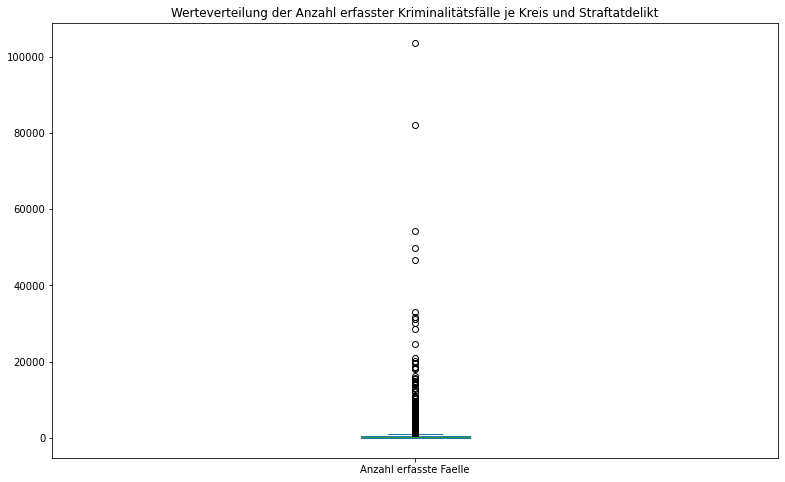

In [51]:
kriminalstatistik[kriminal_spalten[3]].plot(kind='box', figsize = (13,8), 
                                            title = 'Werteverteilung der Anzahl erfasster Kriminalitätsfälle je Kreis und Straftatdelikt')

Erkenntnis: 
Die Anzahl der erfassten Kriminalitätsfälle je Kreis und Straftatdelikt haben eine enorm großen Wertebereich. Allerdings ist diese Variable, als absolute Größe, sicherlich auch stark beeinflusst durch die Bevölkerungszahl und eventuell auch die Bevölkerungsdichte der jeweiligen Kreise. Ein möglicher Zusammenhang zwischen der Bevölkerungszahl/Bevölkerungsdichte der jeweiligen Kreise und der Anzahl der Kriminalitätsfälle wird demnach im späteren Verlauf dieser Analyse noch genauer betrachtet.

In [52]:
kriminalstatistik.loc[kriminalstatistik['Anzahl erfasste Faelle'].idxmax()]

Kreis_ID                                                                 11000
Straftat_Cluster                                           Straßenkriminalität
Stadt-/Landkreis                                                        Berlin
Anzahl erfasste Faelle                                                  103622
Haeufigkeitszahl                                                          2824
                                                                  ...         
Anteil Ausländer Aufenthaltsdauer 10 bis unter 25 Jahre                   22.1
Anteil Ausländer Aufenthaltsdauer 25 Jahre und mehr                       23.4
Bundesland_ID                                                               11
Bundesland                                                              Berlin
Kriminalitätsrate                                                      0.02828
Name: 7144, Length: 144, dtype: object

Der Höchstwert erfasster Kriminalitätsfälle erreicht hier Berlin im Bereich der Straßenkriminalität mit insgesamt 103.622 erfassten Fällen im Jahr 2020.

### Summe der erfassten Straftaten pro Straftatcluster

In [53]:
Fälle_pro_Cluster = kriminalstatistik[[kriminal_spalten[1], kriminal_spalten[3]]]
Fälle_pro_Cluster_aggr = Fälle_pro_Cluster.groupby(['Straftat_Cluster']).sum().sort_values('Anzahl erfasste Faelle', ascending=False)
Fälle_pro_Cluster_aggr = Fälle_pro_Cluster_aggr.reset_index()
Fälle_pro_Cluster_aggr.head()

,Straftat_Cluster,Anzahl erfasste Faelle
0,Straßenkriminalität,1021339
1,Betrug,730498
2,Sachbeschädigung,574364
3,Körperverletzung (einfach),372957
4,Rauschgift,361275


<AxesSubplot:title={'center':'Summe der erfassten Kriminalitätsfälle pro Straftatcluster'}, xlabel='Straftat_Cluster'>

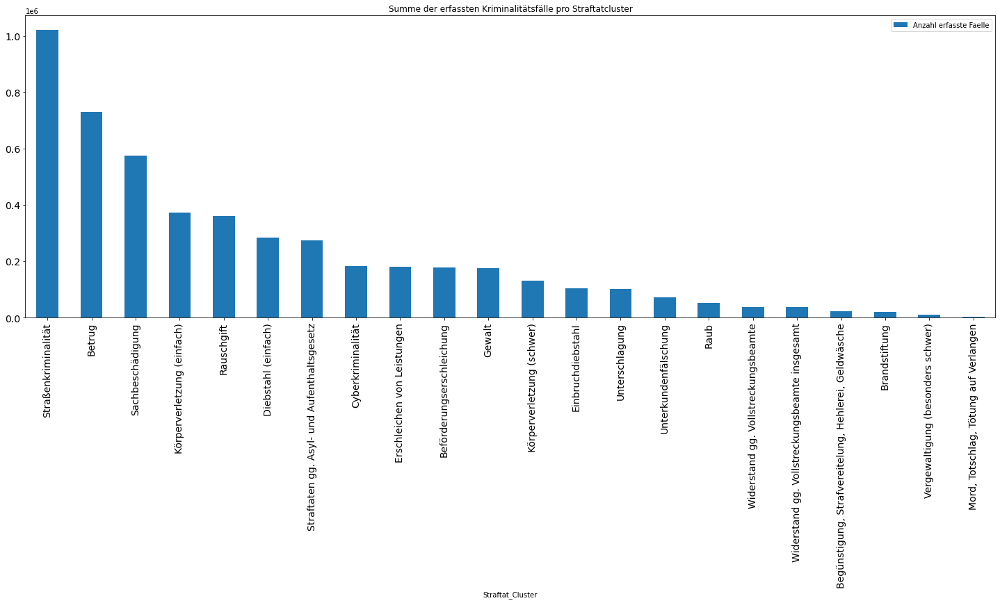

In [54]:
Fälle_pro_Cluster_aggr.plot(x='Straftat_Cluster', y= 'Anzahl erfasste Faelle', figsize = [25,8], kind = 'bar',
                           title = 'Summe der erfassten Kriminalitätsfälle pro Straftatcluster', fontsize = 14)

Erkenntnis: Im Bundesgebiet wurden im Jahr 2020 ca. 1.000.000 Fälle von Straßenkriminalität erfasst.

Ebenfalls sehr auffällig und mit einer hohen Fallzahl vertreten sind folgende Delikte:

* Betrug, 
* Sachbeschädigung 
* Einfache Körperverletzung
* Rauschgiftdelikte

### Relativer Anteil der Summe aller erfassten Straftaten je Straftatcluster

<AxesSubplot:title={'center':'Anzahl erfasste Fälle je Straftatcluster'}>

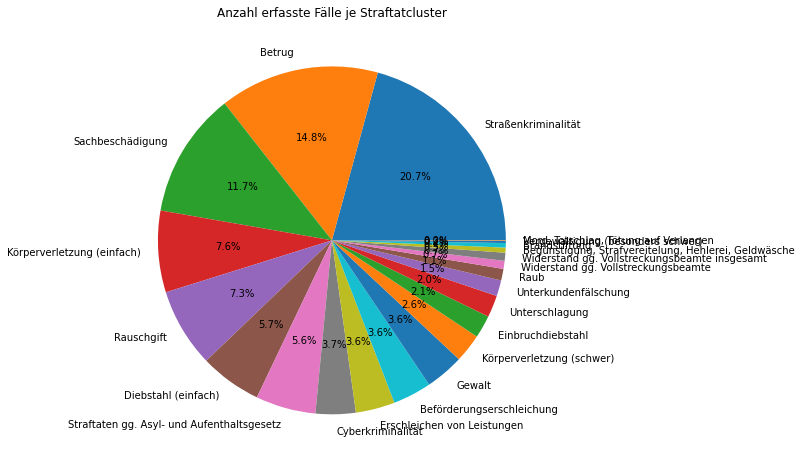

In [55]:
# Relativer Anteil der Summe aller erfassten Straftaten je Straftatcluster
Fälle_pro_Cluster_aggr = Fälle_pro_Cluster_aggr.set_index('Straftat_Cluster')
Fälle_pro_Cluster_aggr.plot(y = 'Anzahl erfasste Faelle', kind = 'pie', figsize = [100,8], legend = False,
                           title = 'Anzahl erfasste Fälle je Straftatcluster', ylabel = '', autopct='%1.1f%%')

Erkenntnis:
Die Top 5 Strafdelikte sind:
1. Straßenkriminalität
2. Betrug 
3. Sachbeschädigung
4. Einfache Körperverletzung
5. Rauschgiftdelikte

Diese Strafdeliktcluster machen > 60% aller Straftaten aus.

### Anzahl erfasster Straftaten je Bundesland

<AxesSubplot:title={'center':'Anzahl Straftaten je Bundesland'}, xlabel='Bundesland'>

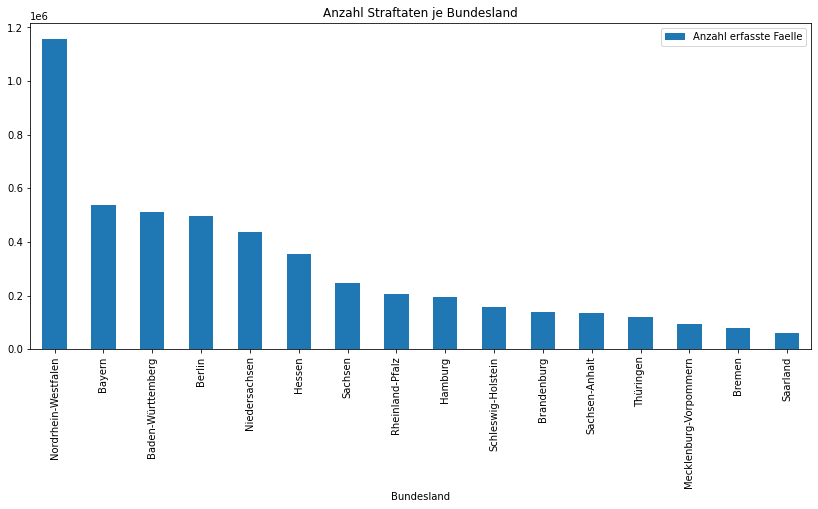

In [56]:
ant_bundesl = kriminalstatistik[['Bundesland', 'Anzahl erfasste Faelle']].groupby('Bundesland').sum().reset_index().sort_values('Anzahl erfasste Faelle', ascending = False)
ant_bundesl.plot(kind='bar', figsize = [14,6], title = 'Anzahl Straftaten je Bundesland', x = 'Bundesland',
                 y = 'Anzahl erfasste Faelle')

Erkenntnis: Die absolute Anzahl erfasster Straftaten ist im Bundesland NRW am Höchsten (mit Abstand).

Es folgen Bayern, Baden-Württemberg und Berlin.

Die absolute Größe der erfassten Straftaten ist an dieser Stelle vermutlich nicht der richtige Maßstab.
Geeigneter wäre eine Betrachtung im Verhältnis zur Einwohnerzahl, da so die unterschiedliche Größe und Bevölkerungsanzahl in den einzelnen Kreisgebieten bei der Betrachtung der Kriminalitätsfälle Berücksichtigung findet.

### Anzahl erfasster Straftaten je Bundesland: Vergleich zur Aufklärungsrate

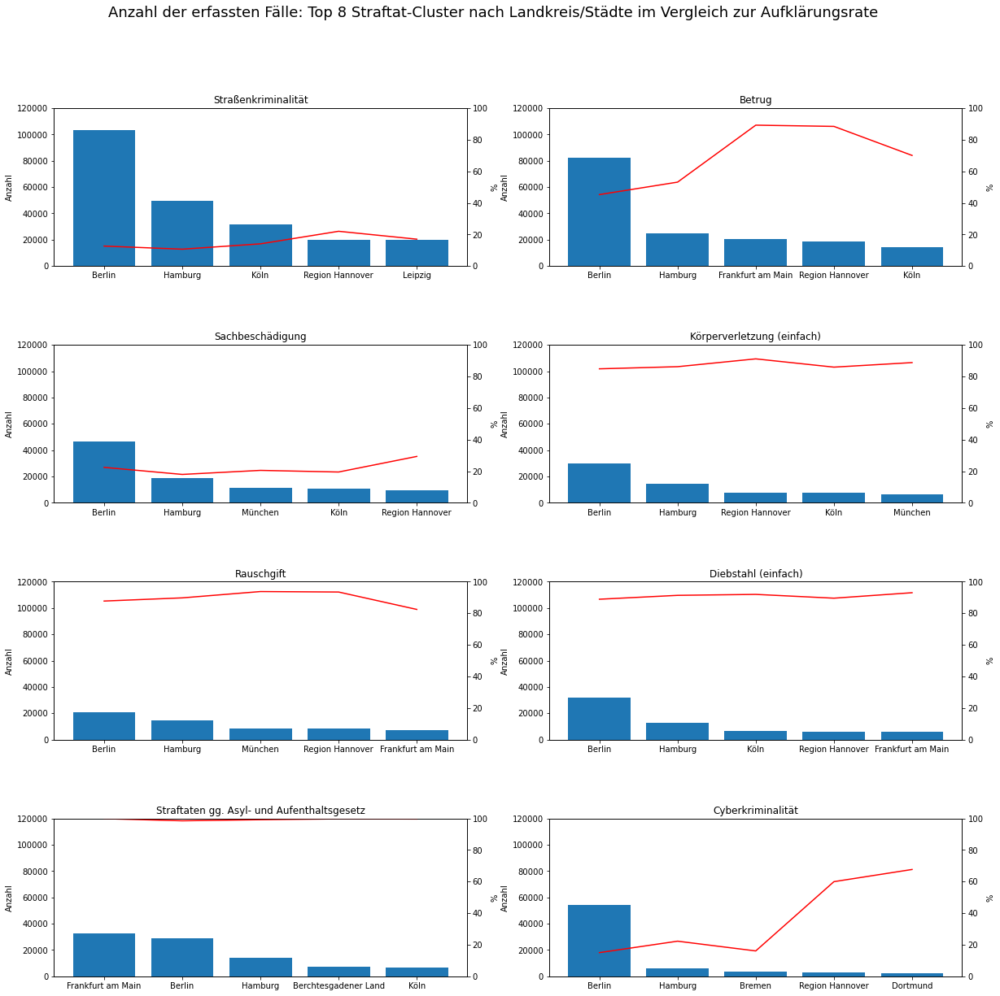

In [57]:
# Anzahl der erfassten Fälle: Top Cluster nach Landkreis/Städte

## Preparation

df_1 = pd.DataFrame(df.groupby('Straftat_Cluster')["Anzahl erfasste Faelle"].sum()).sort_values('Anzahl erfasste Faelle', ascending=False)
straftat_top = df_1.reset_index(drop=False).head(8)
straftat_top_list = straftat_top['Straftat_Cluster'].tolist()
top_list_len = len(straftat_top_list)

df_small = df[['Straftat_Cluster','Stadt-/Landkreis','Anzahl erfasste Faelle','Aufklaerungsquote in %']].sort_values('Anzahl erfasste Faelle',ascending=False)
df_straftat_landkreis = df_small.groupby(['Straftat_Cluster'],sort=False).head(5)

df_straftat_landkreis_top_5 = df_straftat_landkreis[df_straftat_landkreis['Straftat_Cluster'].isin(straftat_top_list)]


## Plot

plt.figure(figsize=(20,25))
plt.subplots_adjust(hspace=0.5)
plt.suptitle('Anzahl der erfassten Fälle: Top '+ str(top_list_len) + ' Straftat-Cluster nach Landkreis/Städte im Vergleich zur Aufklärungsrate', fontsize=18, y=0.95)


for n,straftat_top_list in enumerate(straftat_top_list):
    ax1 = plt.subplot(5,2,n+1)
    ax2 = ax1.twinx()
    
    df0=df_straftat_landkreis_top_5[df_straftat_landkreis_top_5['Straftat_Cluster']==straftat_top_list]
    
    ax1.bar(df0['Stadt-/Landkreis'],df0['Anzahl erfasste Faelle'])
    ax2.plot(df0['Stadt-/Landkreis'],df0['Aufklaerungsquote in %'],color='red')
    
    ax1.set_title(straftat_top_list)
    ax1.set_ylabel("Anzahl")
    ax2.set_ylabel('%')
    ax1.set_ylim([0,120000])
    ax2.set_ylim([0,100])

plt.show()

Das unter 2.1.2 als Top-Straftat erfasste Delikt "Straßenkriminalität" weist unter den Top5 Kreisen / Städten eine sehr geringe Aufklärungsquote auf (<40 %). Interessant ist, dass wohl eine leichte Steigerung der Aufklärungsquote direkt eine deutliche Reduktion der erfassten Straftaten nach sich zieht, wie das Straftatcluster "Betrug" zeigt:
Liegt die Aufklärungsquote in Berlin bei knapp über 40 %, liegt sie in Hamburg bei knapp über 50 %, was eine direkte Reduktion der Straftaten um fast 2/3 nach sich zu ziehen scheint.

Auffallend ist außerdem, dass Berlin häufig mit deutlichem Vorsprung einzelne Straftatcluster anführt und gleichzeitig eine niedrige Aufklärungsquote besitzt.

### Kriminalitätsrate je Bundesland

<AxesSubplot:title={'center':'Kriminalitätsrate je Bundesland'}, xlabel='Bundesland'>

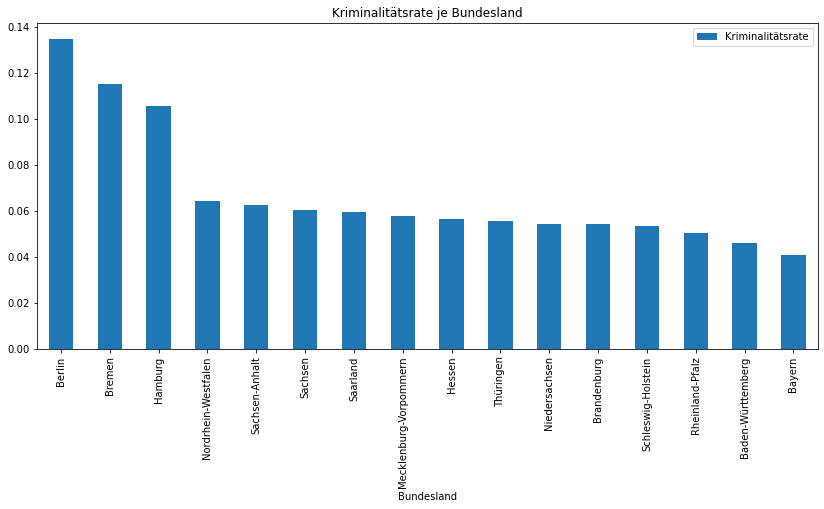

In [58]:
# Kriminalitätsrate (Anzahl erfasster Fälle je Einwohner) je Bundesland
bundesl_bevölkerung = kriminalstatistik[['Bundesland','Kreis_ID', 'Bevölkerung insgesamt']].groupby(['Bundesland', 'Kreis_ID']).mean().reset_index()
bundesl_bevölkerung = bundesl_bevölkerung[['Bundesland', 'Bevölkerung insgesamt']].groupby('Bundesland').sum().reset_index()
bundesl_kriminalitätsrate = pd.merge(ant_bundesl, bundesl_bevölkerung, on = 'Bundesland', how='left')
bundesl_kriminalitätsrate['Kriminalitätsrate'] = bundesl_kriminalitätsrate['Anzahl erfasste Faelle'] / bundesl_kriminalitätsrate['Bevölkerung insgesamt']
bundesl_kriminalitätsrate = bundesl_kriminalitätsrate.sort_values('Kriminalitätsrate', ascending =False)
bundesl_kriminalitätsrate.plot(kind='bar', figsize = [14,6], title = 'Kriminalitätsrate je Bundesland', x = 'Bundesland',
                 y = 'Kriminalitätsrate')

Erkenntnis:

Entgegen der absoluten Anzahl erfasster Straftaten je Bundesland ist die Kriminalitätsrate (Anzahl erfasster Straftaten pro Kopf an der Gesamtbevölkerung des Bundeslandes) in Berlin, Bremen und Hamburg mit Abstand am Höchsten.

NRW, absolut als Spitzenreiter identifiziert, steht gemessen hinsichtlich der Kriminalitätsrate an Platz 4 auf der Liste der Bundesländer in Deutschland.

Im nächsten Schritt schauen wir uns die Kriminalitätsrate je Bundesland und Kreisgebiet in einer greographischen Kartendarstellung an.

In [59]:
# Anpassung der Bundesland_ID an die Bundesland ID "SN_L" im geojson-File
kriminalstatistik_map_bundesl = kriminalstatistik
kriminalstatistik_map_bundesl['Bundesland_ID'] = kriminalstatistik_map_bundesl['Bundesland_ID'].astype(str)
kriminalstatistik_map_bundesl['Kreis_ID'] = kriminalstatistik_map_bundesl['Kreis_ID'].astype(str)

kriminalstatistik_map_bundesl['Bundesland_ID_long'] = np.where(kriminalstatistik_map_bundesl['Bundesland_ID'].str.len() == 1, '0'+kriminalstatistik_map_bundesl['Bundesland_ID'], kriminalstatistik_map_bundesl['Bundesland_ID'])
kriminalstatistik_map_bundesl['Kreis_ID_long'] = np.where(kriminalstatistik_map_bundesl['Kreis_ID'].str.len() == 4, '0'+kriminalstatistik_map_bundesl['Kreis_ID'], kriminalstatistik_map_bundesl['Kreis_ID'])

# Aggregation der Kriminalstatistikdaten für die Map-Darstellung auf Kreisebene (ohne Straftatcluster)

kriminalstatistik_map_bundesl_aggr = kriminalstatistik_map_bundesl[['Bundesland_ID_long', 'Anzahl erfasste Faelle']].groupby('Bundesland_ID_long').sum().reset_index()
kriminalstatistik_map_bundesl_aggr2 = kriminalstatistik_map_bundesl[['Bundesland_ID_long', 'Kreis_ID_long', 'Bevölkerung insgesamt']].groupby(['Bundesland_ID_long', 'Kreis_ID_long']).mean().reset_index()
kriminalstatistik_map_bundesl_aggr3 = kriminalstatistik_map_bundesl_aggr2[['Bundesland_ID_long', 'Bevölkerung insgesamt']].groupby('Bundesland_ID_long').sum().reset_index()
kriminalstatistik_map_bundesl_total = pd.merge(kriminalstatistik_map_bundesl_aggr, kriminalstatistik_map_bundesl_aggr3, on = 'Bundesland_ID_long', how = 'inner')
kriminalstatistik_map_bundesl_total['Kriminalitätsrate'] = kriminalstatistik_map_bundesl_total['Anzahl erfasste Faelle']/kriminalstatistik_map_bundesl_total['Bevölkerung insgesamt']

In [60]:
# Einbindung einer geojson-Datei in die Map (Landkreise in Deutschland)
kreis_geo = "https://raw.githubusercontent.com/andreashrb/Python_for_DS_Project/main/data/landkreise_simplify200.json"

kriminaldata = kriminalstatistik_map_bundesl_total

# Die Einfärbung der Bundeslandgebiete erfolgt anhand der Quantile der "Kriminalitätsrate" der Kriminalstatistik
bins = list(kriminaldata["Kriminalitätsrate"].quantile([0, 0.25, 0.5, 0.75, 1]))

m = folium.Map(location=[51.0834196, 10.4234469], zoom_start=6)

folium.Choropleth(
    geo_data=kreis_geo,
    name="choropleth",
    data=kriminaldata,
    columns=["Bundesland_ID_long", "Kriminalitätsrate"],
    key_on='feature.properties.SN_L',
    fill_color="OrRd",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Kriminalitätsrate",
    bins = bins,
    reset=True
    
).add_to(m)

folium.LayerControl().add_to(m)

m

Erkenntnise aus geographischer Darstellung:
    
Die geographische Darstellung bestätigt in erster Linie das vorangegangene Balkendiagramm.
Die Einfärbung der Bundesländer orientiert sich an den Quantilen der Kriminalitätsrate über alle Bundesländer im Datensatz.

Berlin, Hamburg, Bremen und Nordrhein-Westfalen liegen mit ihrer Kriminalitätsrate von > 0.06 im oberster Quantil und sind entsprechend dunkelrot eingefärbt

Insbesondere im Süden von Deutschland ist die Kriminalitätsrate auf Bundeslandebene auffällig niedrig.

### Kriminalitätsrate je Kreisgebiet

In [61]:
# Anpassung der Kreis_ID's an die Kreis_ID "RS" im GEOJSON-File
kriminalstatistik_map = kriminalstatistik

# Aggregation der Kriminalstatistikdaten für die Map-Darstellung auf Kreisebene (ohne Straftatcluster)

kriminalstatistik_map_aggr = kriminalstatistik_map[['Kreis_ID_long', 'Anzahl erfasste Faelle']].groupby('Kreis_ID_long').sum().reset_index()
kriminalstatistik_map_aggr2 = kriminalstatistik_map[['Kreis_ID_long', 'Bevölkerung insgesamt']].groupby('Kreis_ID_long').mean().reset_index()
kriminalstatistik_map_total = pd.merge(kriminalstatistik_map_aggr, kriminalstatistik_map_aggr2, on = 'Kreis_ID_long', how = 'inner')
kriminalstatistik_map_total['Kriminalitätsrate'] = kriminalstatistik_map_total['Anzahl erfasste Faelle']/kriminalstatistik_map_total['Bevölkerung insgesamt']

In [62]:
# Einbindung einer geojson-Datei in die Map (Landkreise in Deutschland)
kreis_geo = "https://raw.githubusercontent.com/andreashrb/Python_for_DS_Project/main/data/landkreise_simplify200.json"

kriminaldata = kriminalstatistik_map_total

# Die Einförbung der Kreisgebiete erfolgt anhand der Quantile der "Kriminalitätsrate" der Kriminalstatistik
bins = list(kriminaldata["Kriminalitätsrate"].quantile([0, 0.25, 0.5, 0.75, 1]))

m = folium.Map(location=[51.0834196, 10.4234469], zoom_start=6)

folium.Choropleth(
    geo_data=kreis_geo,
    name="choropleth",
    data=kriminaldata,
    columns=["Kreis_ID_long", "Kriminalitätsrate"],
    key_on='feature.properties.RS',
    fill_color="OrRd",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Kriminalitätsrate",
    bins = bins,
    reset=True
    
).add_to(m)

folium.LayerControl().add_to(m)

m

Erkenntnise aus geographischer Darstellung auf Kreisebene:

Auch auf Kreisebene wiederholt sich das Bild aus der Darstellung auf Bundeslandebene.

Allerdings ist auffällig, dass insbesondere die Kreisgebiete im Osten Deutschlands eine deutlich höhere Kriminalitätsrate aufweisen, als die Kreisgebiete in der Mitte und im Süden Deutschlands.

### Tatverdächtige nach Geschlecht je Straftatdeliktcluster

In [63]:
FälleProGeschlecht = kriminalstatistik[[kriminal_spalten[1],kriminal_spalten[9], kriminal_spalten[10], kriminal_spalten[11]]]
FälleProGeschlecht_aggr = FälleProGeschlecht.groupby(['Straftat_Cluster']).sum().sort_values('Tatverdaechtige insgesamt', ascending = False)
FälleProGeschlecht_aggr = FälleProGeschlecht_aggr.reset_index()


<AxesSubplot:title={'center':'Anzahl Tatverdächtige pro Straftatcluster nach Geschlechtern'}, xlabel='Straftat_Cluster'>

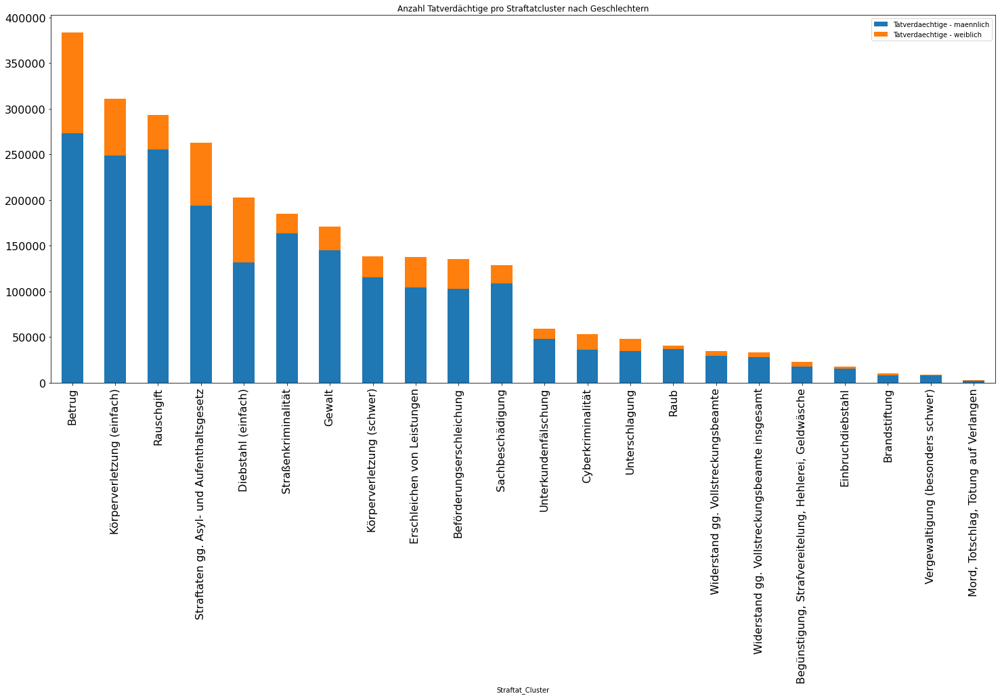

In [64]:
FälleProGeschlecht_aggr.plot(x = 'Straftat_Cluster', y = ['Tatverdaechtige - maennlich', 'Tatverdaechtige - weiblich'], figsize = [25,10], kind = 'bar',
                            title = 'Anzahl Tatverdächtige pro Straftatcluster nach Geschlechtern', stacked = True, fontsize = 16)

Erkenntnisse: Die höchste Anzahl an Tatverdächtigen wurde im Straftatdelikt "Betrug" erfasst. 

In der Differenzierung nach Geschlechtern stellt man fest, dass der Frauenanteil an den Tatverdächtigen in den Straftatdeliktclustern "Betrug" und "einfachem Diebstahl" am Höchsten ausfällt.

Jedoch ist die Mehrheit der Tatverdächtigen in allen Straftatclustern männlich.

### Aufklärungsquote je Straftatdeliktcluster

In [65]:
Aufklaerung = kriminalstatistik[[kriminal_spalten[1],kriminal_spalten[-4]]]
Aufklaerung_aggr = Aufklaerung.groupby(['Straftat_Cluster']).mean().sort_values('Aufklaerungsquote in %', ascending=False)
Aufklaerung_aggr = Aufklaerung_aggr.reset_index()

<AxesSubplot:title={'center':'Durchschnittliche Aufklärungsquote pro Straftat Cluster'}, xlabel='Straftat_Cluster'>

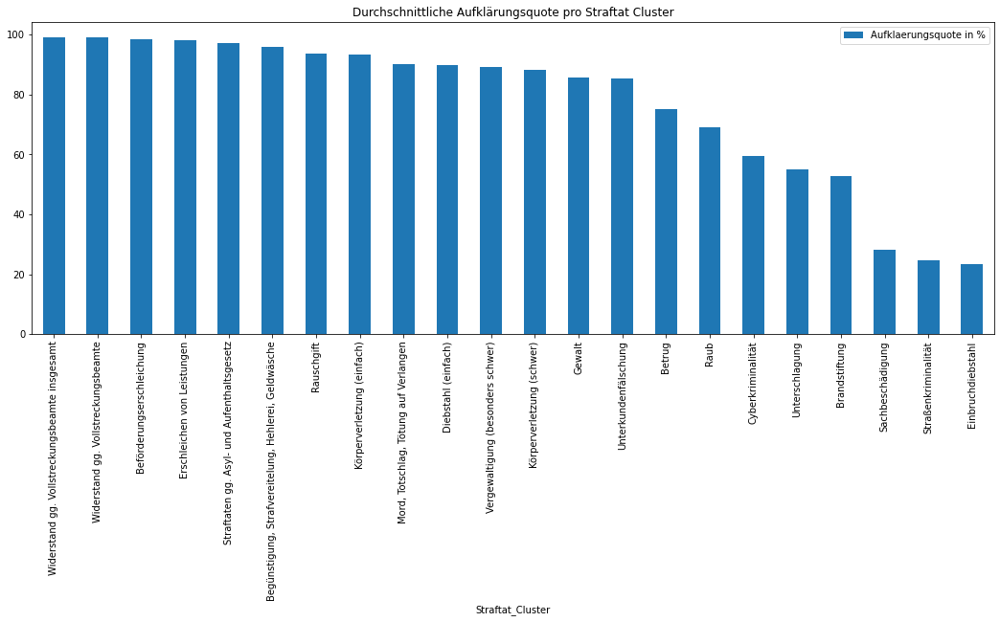

In [66]:
Aufklaerung_aggr.plot(kind='bar', x = 'Straftat_Cluster', y = 'Aufklaerungsquote in %', figsize = [18,6], 
                      title = 'Durchschnittliche Aufklärungsquote pro Straftat Cluster')

Erkenntnis: Die niedrigsten Aufklärungsquoten über alle Kreise hinweg liegen mit > = 30% in den Strafdelikten Sachbeschädigung, Straßenkriminalität und Einbruchdiebstahl vor.

Die besten Aufklärungsquoten hingegen bestehen bei Straftaten in den Deliktarten "Widerstand gg. Vollstreckungsbeamte", "Beförderungserschleichung", "Erschleichen von Leistungen" und bei Straftaten gg. Asyl- und Aufenthaltsgesetze.

**Auffälligkeit:** Die Straftatdelikte mit geringen Aufklärungsquoten sind auch, wie oben dargestellt, i.d.R. Bestandteil der TOP-Straftaten im Bundesgebiet im Jahr 2020

In [67]:
Fälle_pro_Cluster_aggr = Fälle_pro_Cluster_aggr.reset_index()

In [68]:
delikte_aufklärung = pd.merge(Fälle_pro_Cluster_aggr, Aufklaerung_aggr, on = 'Straftat_Cluster', how = 'left')

array([<AxesSubplot:title={'center':'Anzahl erfasste Faelle'}, xlabel='Straftat_Cluster'>,
       <AxesSubplot:title={'center':'Aufklaerungsquote in %'}, xlabel='Straftat_Cluster'>],
      dtype=object)

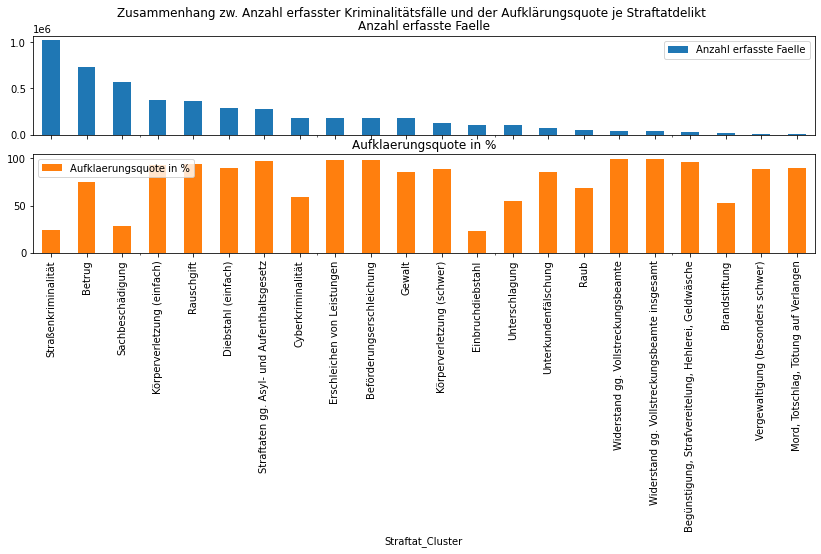

In [69]:
delikte_aufklärung.plot(kind = 'bar', x = 'Straftat_Cluster', y = ['Anzahl erfasste Faelle', 'Aufklaerungsquote in %'], figsize = [14,4],
                       subplots = True, title = 'Zusammenhang zw. Anzahl erfasster Kriminalitätsfälle und der Aufklärungsquote je Straftatdelikt')

Erkenntnis: 

Bundesweit wurden die meisten Kriminalitätsfälle im Straftatdelikt "Straßenkriminalität" erfasst, während dieses Straftatdelikt bundesweit die geringste Aufklärungsquote aufweist.

Ein ähnliches Bild spielgelt sich mit Blick auf das Straftatdelikt "Sachbeschädigung" wieder. Eine geringe Aufklärungsquote resultiert in einer hohen Anzahl erfasster Fälle.

Tendenziell werden weniger Fälle (absolut) erfasst, wo die Aufklärungsquote höher ausfällt. Allerdings bestimmen, bei einzelnen Deliktarten, auch Ausnahmen die Regel, wie z.B. das Straftatdelikt "Betrug".

### Nichtdeutsche Tatverdächtige je Straftatdelikt

In [70]:
auslaender = kriminalstatistik[['Straftat_Cluster','Nichtdeutsche Tatverdaechtige - Anteil in % an der Gesamtzahl']]
auslaender_aggr = auslaender.groupby(['Straftat_Cluster']).mean().sort_values('Nichtdeutsche Tatverdaechtige - Anteil in % an der Gesamtzahl', ascending = False)
auslaender_aggr = auslaender_aggr.reset_index()
auslaender_aggr.head()

,Straftat_Cluster,Nichtdeutsche Tatverdaechtige - Anteil in % an der Gesamtzahl
0,Straftaten gg. Asyl- und Aufenthaltsgesetz,97.936330
1,Unterkundenfälschung,46.933803
2,Beförderungserschleichung,43.642883
3,Erschleichen von Leistungen,43.567760
4,Einbruchdiebstahl,41.639855


<AxesSubplot:title={'center':'Durchschnittlicher Anteil nicht deutscher Tatverdächtiger pro Straftatcluster'}, xlabel='Straftat_Cluster'>

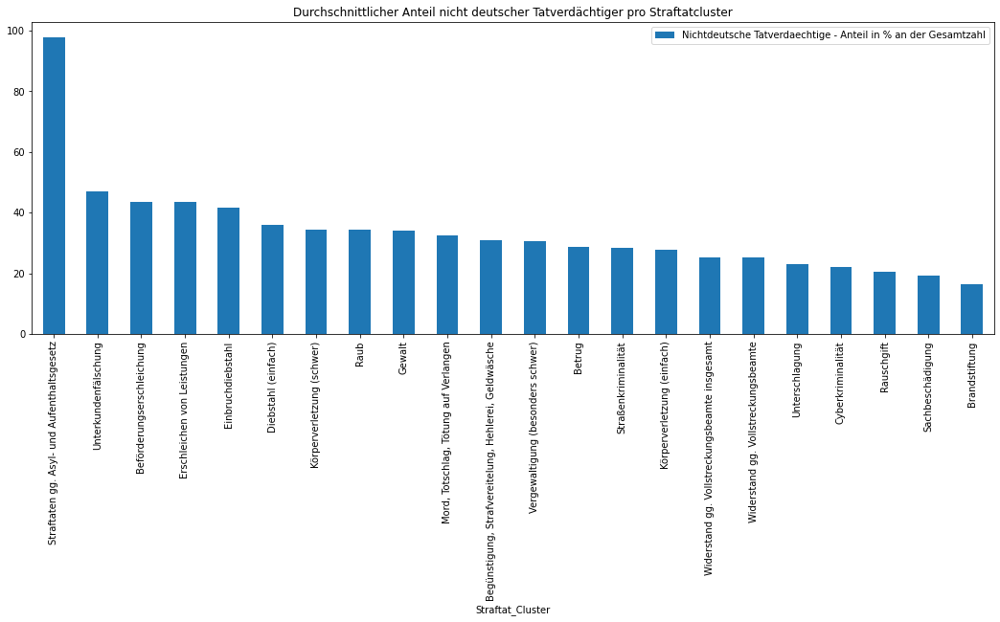

In [71]:
auslaender_aggr.plot(x = 'Straftat_Cluster', y = 'Nichtdeutsche Tatverdaechtige - Anteil in % an der Gesamtzahl', 
                     kind = 'bar', 
                     figsize = [18,6], 
                     title = 'Durchschnittlicher Anteil nicht deutscher Tatverdächtiger pro Straftatcluster')

Erkenntnis: Logischerweise ist die Beteiligung Nichtdeutscher Tatverdächtiger insbesondere bei Delikten gg. das Asyl- und Aufenthaltsgesetz am Höchsten und sticht mit fast 100% hervor.

Allerdings gibt es auch darüber hinaus noch  einige weitere Straftatdelikte, bei denen die Beteiligung nichtdeutscher Tatverdächtiger besonders signifikant und überdurchschnittlich (> 33%) ist.

1. Urkundenfälschung
2. Beförderungserschleichung
3. Erschleichen von Leistungen
4. Einbruchdiebstahl
5. Einfacher Diebstahl
6. Schwere Körperveletzung
7. Raub
8. Gewalt

**Hinweis:** Das sind nicht die TOP-Straftaten (bundesweit) im Jahr 2020

## Analyse der Erwerbstätigen- und Einkommensdaten

In [72]:
# Definition relevanter Spalten aus dem Dataset
erwerbstätige_einkommen

['Verfügbares Einkommen pro Einwohner',
 'Erwerbstätige im Jahresdurchschnitt Insgesamt 1000',
 'Erwerbstätige im Jahresdurchschnitt Land- und Forstwirtschaft, Fischerei (A) 1000',
 'Erwerbstätige im Jahresdurchschnitt Produzierendes Gewerbe ohne Baugewerbe (B-E) 1000',
 'Erwerbstätige im Jahresdurchschnitt Verarbeitendes Gewerbe (C) 1000',
 'Erwerbstätige im Jahresdurchschnitt Baugewerbe (F) 1000',
 'Erwerbstätige im Jahresdurchschnitt Handel,Verkehr,Gastgewerbe,Informa-/Kommunikation 1000',
 'Erwerbstätige im Jahresdurchschnitt Fin-,Vers.-,Unt.-dienstl.,Grundst.-/Wohnungswesen 1000',
 'Erwerbstätige im Jahresdurchschnitt öffentl. u. sonst. Dienstl.,Erziehung, Gesundheit 1000']

### Verteilung der verfügbaren Einkommen je Einwohner je Kreisgebiet

<AxesSubplot:title={'center':'Einkommenverteilung je Kreisgebiet in Deutschland'}>

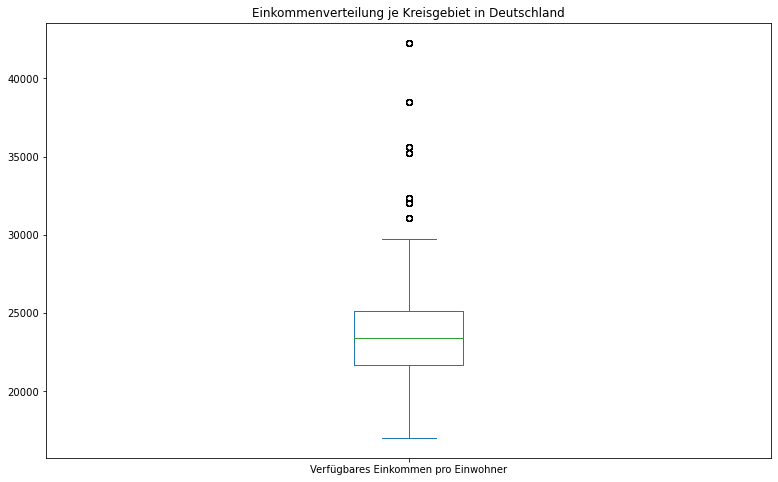

In [73]:
# Verteilung der Einkommen
kriminalstatistik[erwerbstätige_einkommen[0]].plot(kind='box', figsize = (13,8), 
                                            title = 'Einkommenverteilung je Kreisgebiet in Deutschland')

Erkenntnis: Kreisgebiete ab einem verfügbaren pro Kopf Einkommen von 30.000 € sind Ausreißer am oberen Ende aller Kreise. Es handelt sich dementsprechend um eine relativ stark rechtsschiefe Verteilung. Die Spanne der verfügbaren Einkommen pro Kopf in deutschen Kreisgebieten reicht von ca. 17000 € bis hin zu 30.000 €. Eine relativ starke Ungleichverteilung der Einkommen.

### Durchschnittlich verfügbare Einkommen je Bundesland

<AxesSubplot:title={'center':'Durchschnittlich verfügbare Einkommen pro Einwohner in deutschen Bundesländern 2020'}, xlabel='Bundesland'>

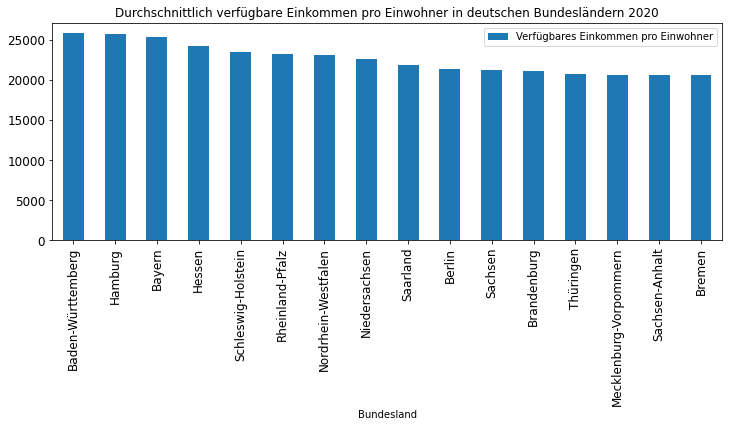

In [74]:
# Durchschnittlich verfügbare Einkommen je Bundesland

einkommen_bundesl = kriminalstatistik[['Bundesland', 'Verfügbares Einkommen pro Einwohner']].groupby('Bundesland')\
                    .mean().reset_index().sort_values('Verfügbares Einkommen pro Einwohner', ascending = False)

einkommen_bundesl.plot(kind='bar', x = 'Bundesland', y = 'Verfügbares Einkommen pro Einwohner', 
                      title = 'Durchschnittlich verfügbare Einkommen pro Einwohner in deutschen Bundesländern 2020',
                      figsize = [12,4], fontsize = 12)

Erkenntnis: Die durchschnittlichen verfügaren Einkommen pro Einwohner in den einzelnen Kreisgebieten Deutschlands sind, aggregiert pro Bundesland, in Baden-Württemberg und Hamburg am Höchsten. An dritter Stelle folgt Bayern.

Das geringste Einkommen pro Kopf haben die Bürger aus Bremen und Sachsen-Anhalt.

Ausgenommen von Bremen, sind die Ostdeutschen Bundesländer im durchschnittlichen Einkommen pro Kopf in ihren Kreisgebieten den westdeutschen Bundesländern unterlegen.

**Anmerkung:** Trotz hohem verfügbaren Pro-Kopf-Einkommen hat Hamburg eine relativ hohe Kriminalitätsrate.
Dennoch lässt der Einkommensvergleich auf Bundeslandebene vermuten, dass ein Zusammenhang zw. Einkommen und Kriminalitätsrate besteht. Die einkommensschwächeren ostdeutschen Bundesländer verzeichnen eine, relativ betrachtet, höhere Kriminalitätsrate als andere Bundesländer (s. oben: Kriminalitätsraten je Bundesland)

### Kriminalitätsrate in Abhängigkeit zum verfügbaren Einkommen pro Kopf

<AxesSubplot:title={'center':'Kriminalitätsrate (Fälle pro Kopf) in Abhängigkeit zum verfügbaren Einkommen pro Kopf'}, xlabel='Verfügbares Einkommen pro Einwohner', ylabel='Fälle pro Kopf'>

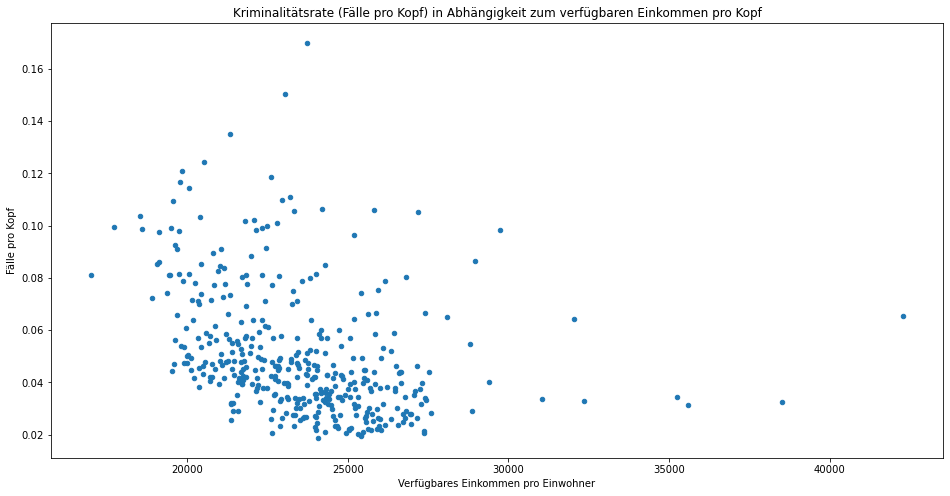

In [75]:
# Kriminalitätsrate (Anzahl Fälle pro Kopf) in Abhängigkeit zum verfügbaren Einkommen pro Kopf

kriminalität_kreis = kriminalstatistik[['Kreis_ID', 'Anzahl erfasste Faelle']].groupby('Kreis_ID').sum().reset_index()
einkommen_bevölkerung_kreis = kriminalstatistik[['Kreis_ID', 'Verfügbares Einkommen pro Einwohner', 'Bevölkerung insgesamt']].groupby('Kreis_ID').mean().reset_index()
kriminalität_einkommen_kopf = pd.merge(kriminalität_kreis, einkommen_bevölkerung_kreis, on = 'Kreis_ID', how = 'inner')
kriminalität_einkommen_kopf['Fälle pro Kopf'] = kriminalität_einkommen_kopf['Anzahl erfasste Faelle']/kriminalität_einkommen_kopf['Bevölkerung insgesamt']

# Plotten der Daten
kriminalität_einkommen_kopf.plot(kind='scatter', x = 'Verfügbares Einkommen pro Einwohner', y = 'Fälle pro Kopf',
                                title = 'Kriminalitätsrate (Fälle pro Kopf) in Abhängigkeit zum verfügbaren Einkommen pro Kopf',
                                figsize = [16,8])


Erkenntnis: Ein leicher Zusammenhang zw. dem verfügbaren EInkommen pro Kopf und der normierten Kriminalitätsrate (Anzahl erfasster Fälle pro Kopf) ist erkennbar.

Liegt im Kreisgebiet ein geringeres Pro-Kopf-Einkommen vor, liegen mehr Straftatdelikte pro Einwohner vor.
Ein höheres Pro-Kopf-Einkommen führt zu einer geringeren Kriminalitätsrate.

Die Datenwolke ist relativ breitflächig und gestreut, dennoch lässt sich hier ein negativer (degressiv fallend) Zusammenhang erkennen.

Interessant wäre im nächsten Schritt zu ergründen, welche Straftatdelikte, insbesondere in Kreisen mit geringerem Pro-Kopf-Einkommen und erhöhter Kriminalitätsrate, erfasst wurden. Ebenso interessant wäre die Kriminalitätsdelikte herauszufinden, die in eher "reicheren" (höheres Pro-Kopf-Einkommen) und geringerer Kriminalitätsrate erfasst werden.

### Verteilung der erwerbstätigen Personen je Kreisgebiet

<AxesSubplot:title={'center':'Verteilung der absoluten Anzahl erwerbstätiger Personen (pro 1000)'}, ylabel='Frequency'>

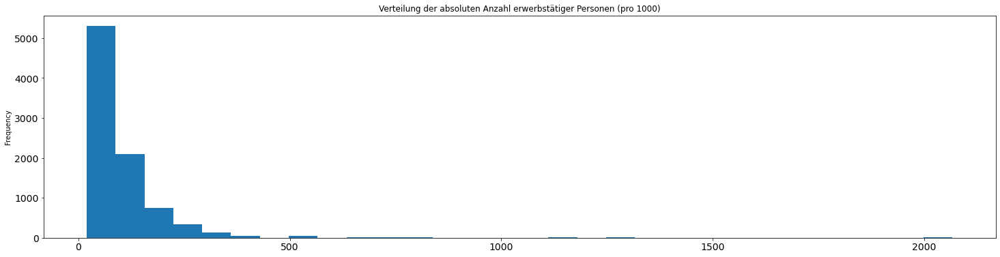

In [76]:
kriminalstatistik[erwerbstätige_einkommen[1]].plot(kind='hist', bins = 30, 
                                                   title = 'Verteilung der absoluten Anzahl erwerbstätiger Personen (pro 1000)', figsize = [25,6],
                                                  fontsize = 14)

<AxesSubplot:title={'center':'Verteilung der absoluten Anzahl erwerbstätiger Personen (pro 1000)'}>

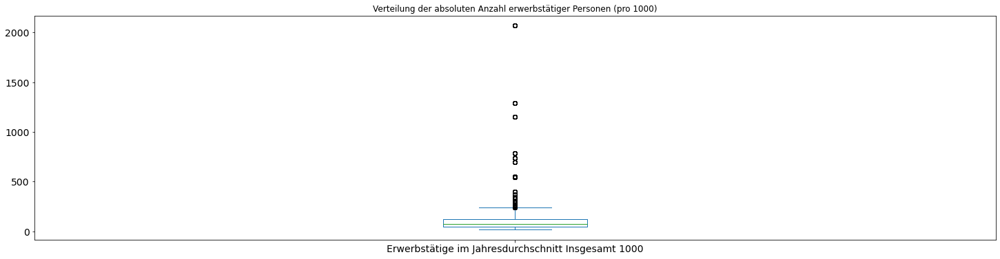

In [77]:
kriminalstatistik[erwerbstätige_einkommen[1]].plot(kind='box', 
                                                   title = 'Verteilung der absoluten Anzahl erwerbstätiger Personen (pro 1000)', 
                                                   figsize = [25,6], fontsize = 14)

Erkenntnisse: Kreisgebiete mit > 200.000 Erwerbstätigen sind Ausreißer (nach rechts). Dies kann selbstverständlich auch auf eine deutlich überdurchschnittlichen Bevölkerungszahl zurückzuführen sein. An dieser Stelle wäre eine relative Betrachtung (im Verhältnis zur Gesamtbevölkerung) interessanter und wird an späterer Stelle noch einmal aufgegriffen.

### Verteilung der erwerbstätigen Personen je Branche über alle Kreisgebiete

In [78]:
erwerbstätige_branche = kriminalstatistik[[kriminal_spalten[0], erwerbstätige_einkommen[1], erwerbstätige_einkommen[2], erwerbstätige_einkommen[3], erwerbstätige_einkommen[4]]]
erwerbstätige_branche_final = erwerbstätige_branche.groupby('Kreis_ID').mean()
erwerbstätige_branche2 = kriminalstatistik[[kriminal_spalten[0], erwerbstätige_einkommen[5], erwerbstätige_einkommen[6], erwerbstätige_einkommen[7], erwerbstätige_einkommen[8]]]

Erwerbstätige im Jahresdurchschnitt Insgesamt 1000                                          AxesSubplot(0.125,0.125;0.168478x0.755)
Erwerbstätige im Jahresdurchschnitt Land- und Forstwirtschaft, Fischerei (A) 1000        AxesSubplot(0.327174,0.125;0.168478x0.755)
Erwerbstätige im Jahresdurchschnitt Produzierendes Gewerbe ohne Baugewerbe (B-E) 1000    AxesSubplot(0.529348,0.125;0.168478x0.755)
Erwerbstätige im Jahresdurchschnitt Verarbeitendes Gewerbe (C) 1000                      AxesSubplot(0.731522,0.125;0.168478x0.755)
dtype: object

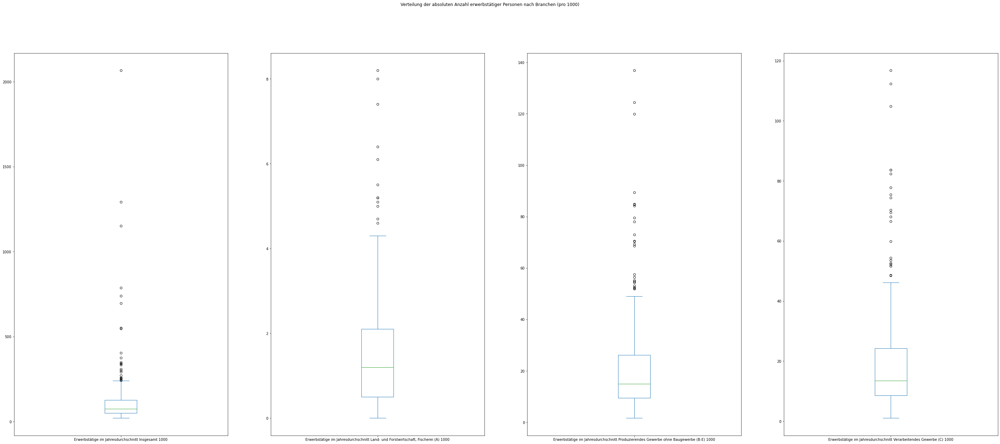

In [79]:
erwerbstätige_branche_final.plot(kind='box', subplots = True, title = 'Verteilung der absoluten Anzahl erwerbstätiger Personen nach Branchen (pro 1000)', figsize = [50,20])

Erwerbstätige im Jahresdurchschnitt Baugewerbe (F) 1000                                          AxesSubplot(0.125,0.125;0.227941x0.755)
Erwerbstätige im Jahresdurchschnitt Handel,Verkehr,Gastgewerbe,Informa-/Kommunikation 1000    AxesSubplot(0.398529,0.125;0.227941x0.755)
Erwerbstätige im Jahresdurchschnitt Fin-,Vers.-,Unt.-dienstl.,Grundst.-/Wohnungswesen 1000    AxesSubplot(0.672059,0.125;0.227941x0.755)
dtype: object

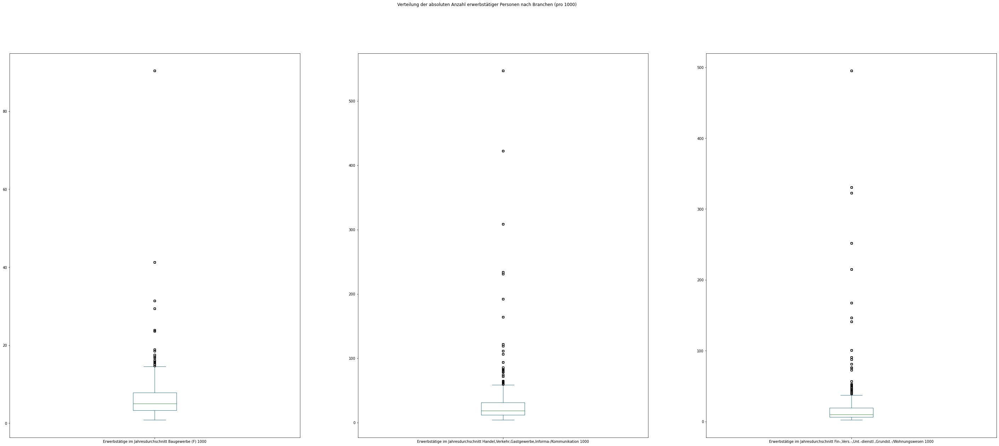

In [80]:
kriminalstatistik[erwerbstätige_einkommen[5:8]].plot(kind='box', subplots = True, title = 'Verteilung der absoluten Anzahl erwerbstätiger Personen nach Branchen (pro 1000)', figsize = [50,20])

Erkenntnis: Am breitesten Gestreut sind die Zahlen der Erwerbstätigen pro Kreisgebiet in der Branche der Land- und Forstwirtschaft, wobei die absolute Zahl der Erwerbstätigen in dieser Branche eher eine Minderheit an den Gesamterwerbstätigen der anderen Branchen über alle Kreise ausmacht. Die breite Streuung der Anzahl der Erwerbstätigen in dieser Branche kommt vermutlich dadurch, dass diese Branche eher in Kreisgebieten ländlicher Regionen vertreten ist (mit entsprechend vielen Wald- und Naturflächen), während in Kreisgebieten bzw. kreisfreien Städten, die weniger ländlich gelegen sind, weniger Betriebe der Forstwirtschaft angesiedelt sind.

Bei der Anzahl der Erwerbstätigen gibt es in allen Branchen relativ extreme AusreißerDas deutet auf eine mögliche Kreis- oder Bundeslandspezifische Verteilung bzw. Ballung der einzelnen Branchen hin. Die einzelnen Kreisgebiete scheinen demnach durchaus strukturelle Unterschiede in dieser Hinsicht aufzuweisen.

## Analyse der Migrations- und Bevölkerungsdaten

### Anzahl erfasster Straftaten über alle Kreise und Straftatdelikte in Abhängigkeit zur Bevölkerungsanzahl

<AxesSubplot:title={'center':'Zusammenhang zw. Bevölkerungszahl und der Anzahl der Straftatdelikte'}, xlabel='Bevölkerung insgesamt', ylabel='Anzahl erfasste Faelle'>

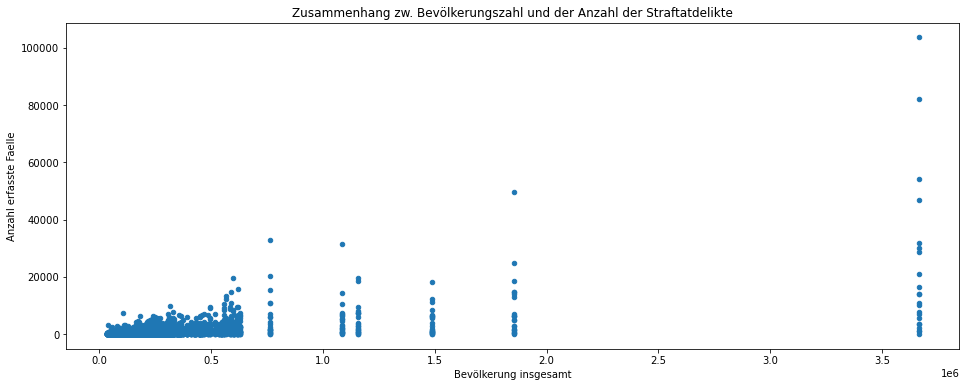

In [81]:
delikte_einwohner = kriminalstatistik[['Kreis_ID', 'Straftat_Cluster', 'Bevölkerung insgesamt', 'Anzahl erfasste Faelle']]
delikte_einwohner
delikte_einwohner.plot(kind = 'scatter', x = 'Bevölkerung insgesamt', y= 'Anzahl erfasste Faelle', figsize = [16,6],
                      title = 'Zusammenhang zw. Bevölkerungszahl und der Anzahl der Straftatdelikte')

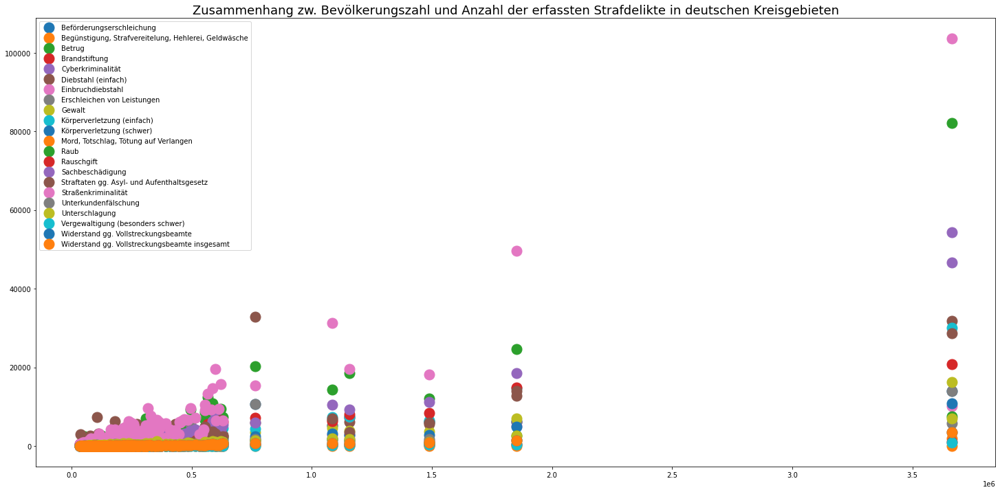

In [82]:
groups = delikte_einwohner.groupby("Straftat_Cluster")
plt.figure(figsize=(25,12))
plt.title ('Zusammenhang zw. Bevölkerungszahl und Anzahl der erfassten Strafdelikte in deutschen Kreisgebieten', fontsize = 18)
for name, group in groups:
    plt.plot(group['Bevölkerung insgesamt'], group['Anzahl erfasste Faelle'], marker="o", linestyle="", label=name, markersize = 15)    
plt.legend()

Erkenntnisse: Der Zusammenhang der Bevölkerungszahl im Verhältnis zu den erfassten Straftaten ist scheinbar positiv. Ein leichter Anstieg der Straftaten bei steigender Bevölkerungszahl zeigt diesen Zusammenhang visuell auf. Eindeutiger könnte es eventuell werden, wenn die Bevölkerungsdichte (Einwohner pro km2) betrachtet wird.

Dabei stechen allerdings keine einzelnen Straftaten hervor.

### Anzahl erfasster Straftaten in Abhängigkeit zur Bevölkerungsdichte

<AxesSubplot:title={'center':'Zusammenhang zw. Bevölkerungsdichte (Bundesland) und Anzahl der erfassten Kriminalitätsfälle'}, xlabel='Bevölkerungsdichte', ylabel='Anzahl erfasste Faelle'>

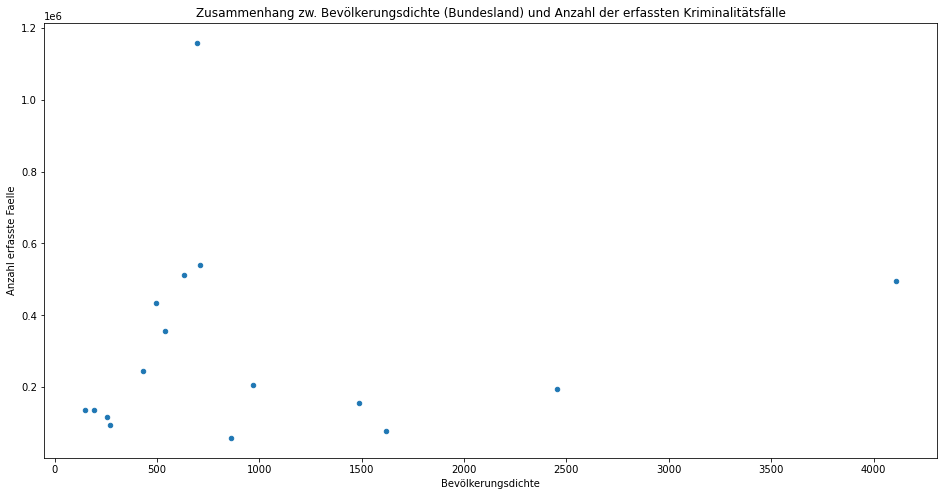

In [83]:
# Straftaten im Zusammenhang mit der Bevölkerungsdichte pro Bundesland
Bundesland_Straftaten = kriminalstatistik[['Bundesland', 'Anzahl erfasste Faelle']].groupby('Bundesland').sum().reset_index()

# Mittelwert der Fläche und der Bevölkerungszahlen je Kreis und Bundesland
Bundesland_Straftaten_Bevölkerungsdichte_prep = kriminalstatistik[['Bundesland', 'Kreis_ID', 'Bevölkerung insgesamt', 'Fläche in km2']].groupby (['Bundesland', 'Kreis_ID']).mean().reset_index()

# Aggregation von Bevölkerungszahlen und Flächendaten je Bundesland (Summe)
Bundesland_Straftaten_Bevölkerungsdichte_prep2 = Bundesland_Straftaten_Bevölkerungsdichte_prep.drop('Kreis_ID', axis =1)
Bundesland_Straftaten_Bevölkerungsdichte_prep2 = Bundesland_Straftaten_Bevölkerungsdichte_prep.groupby('Bundesland').sum().reset_index()

# Joinen von Straftaten pro Bundesland und Bevölkerung/Fläche pro Bundesland
Bundesland_Straftaten_Bevölkerungsdichte = pd.merge(Bundesland_Straftaten_Bevölkerungsdichte_prep2, Bundesland_Straftaten,
                                                   on = 'Bundesland', how = 'left')
# Berechnung der Bevölkerungsdichte
Bundesland_Straftaten_Bevölkerungsdichte['Bevölkerungsdichte'] = Bundesland_Straftaten_Bevölkerungsdichte['Bevölkerung insgesamt'] / Bundesland_Straftaten_Bevölkerungsdichte['Fläche in km2'] 

Bundesland_Straftaten_Bevölkerungsdichte.plot(kind = 'scatter', x = 'Bevölkerungsdichte', y = 'Anzahl erfasste Faelle',
                                             title = 'Zusammenhang zw. Bevölkerungsdichte (Bundesland) und Anzahl der erfassten Kriminalitätsfälle',
                                             figsize = [16,8])

Erkenntnis: Auf Bundeslandebene lässt sich kein klarer Zusammenhang zw. Bevölkerungsdichte und der Anzahl der erfassten Delikte definieren. Ein Blick auf Kreisebene würde die Anzahl der Datenpunkte erhöhen und ein granulareres Bild liefern.

<AxesSubplot:title={'center':'Zusammenhang zw. Bevölkerungsdichte (Kreisgebiete) und Anzahl der Kriminalitätsfälle'}, xlabel='Bevölkerungsdichte', ylabel='Anzahl erfasste Faelle'>

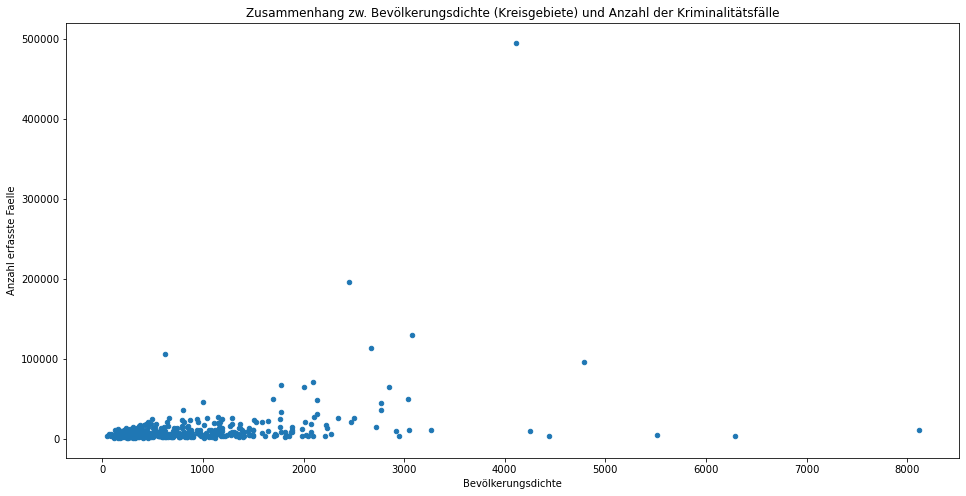

In [84]:
# Straftaten im Zusammenhang mit der Bevölkerungsdichte pro Kreisgebiet
Bundesland_Straftaten_Kreis = kriminalstatistik[['Kreis_ID', 'Anzahl erfasste Faelle']].groupby(['Kreis_ID']).sum().reset_index()

# Mittelwert der Fläche und der Bevölkerungszahlen je Kreis (Aufsummieren würde hier zu falschen Ergebnissen führen)
Bundesland_Straftaten_Bevölkerungsdichte_Kreis = kriminalstatistik[['Kreis_ID', 'Bevölkerung insgesamt', 'Fläche in km2']].groupby (['Kreis_ID']).mean().reset_index()

# Joinen der beiden DataFrames
Kreis_Straftaten_Bevölkerungsdichte = pd.merge(Bundesland_Straftaten_Kreis, Bundesland_Straftaten_Bevölkerungsdichte_Kreis, on = 'Kreis_ID', how = 'left')

# Berechnung der Bevölkerungsdichte auf Kreisebene
Kreis_Straftaten_Bevölkerungsdichte['Bevölkerungsdichte'] = Kreis_Straftaten_Bevölkerungsdichte['Bevölkerung insgesamt'] / Kreis_Straftaten_Bevölkerungsdichte ['Fläche in km2']

# Plotten der Daten
Kreis_Straftaten_Bevölkerungsdichte.plot(kind = 'scatter', x = 'Bevölkerungsdichte', y = 'Anzahl erfasste Faelle',
                                        title = 'Zusammenhang zw. Bevölkerungsdichte (Kreisgebiete) und Anzahl der Kriminalitätsfälle',
                                        figsize = [16,8])

Erkenntnis: Auch auf Kreisebene (mehr Datenpunkte als auf Bundeslandebene) lässt sich kein klarer Zusammenhang zwischen der Bevölkerungsdichte eines Kreisgebiets und den dort erfassten Strafdelikten im Jahr 2020 erkennen. Eine leichte Tendenz, ein leicht positiver Zusammenhang, lässt sich hier erahnen. Allerdings streut der Plot ab einer Bevölkerungsdichte von 2000 Einwohnern pro km2 sehr stark, sodass keine Eindeutigkeit des Zusammenhangs behauptet werden kann.

Die Bevölkerungsdichte sollte im Folgenden noch mit der Kriminalitätsrate (Anzahl erfasste Fälle je Einwohner) auf Abhängigkeiten geprüft werden.

### Kriminalitätsrate in Abhängigkeit zur Bevölkerungsdichte

<AxesSubplot:title={'center':'Zusammenhang zw. Bevölkerungsdichte und der Kriminalitätsrate (Kreisgebiete)'}, xlabel='Bevölkerungsdichte', ylabel='Kriminalitätsrate'>

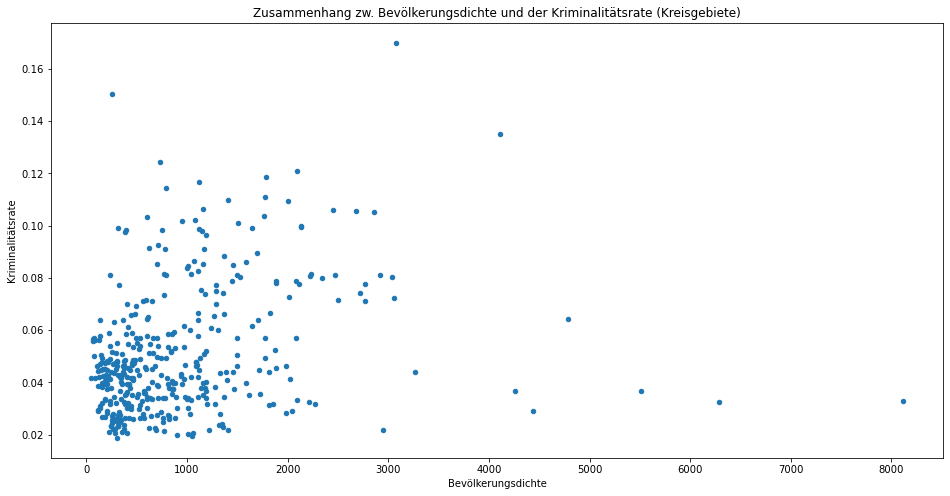

In [85]:
# Berechnung der Kriminalitätsrate auf Kreisgebietsebene
Kreis_Straftaten_Bevölkerungsdichte['Kriminalitätsrate'] = Kreis_Straftaten_Bevölkerungsdichte['Anzahl erfasste Faelle'] / Kreis_Straftaten_Bevölkerungsdichte['Bevölkerung insgesamt']

# Plotten der Daten
Kreis_Straftaten_Bevölkerungsdichte.plot(kind = 'scatter', x = 'Bevölkerungsdichte', y = 'Kriminalitätsrate',
                                        title = 'Zusammenhang zw. Bevölkerungsdichte und der Kriminalitätsrate (Kreisgebiete)',
                                        figsize = [16,8])

Erkenntnis:

Die Kriminalitätsrate steigt mit steigender Bevölkerungsdichte signifikant.

Kreisgebiete mit relativ hoher Bevölkerungsdichte weisen deutlich höhere Kriminalitätsraten auf. Ausnahmen bestimmen die Regel - es gibt demnach Ausreißer in Form von Kreisgebieten, die trotz hoher Bevölkerungsdichte eine recht geringe Kriminalitätsrate aufweisen.


### Verteilung der Beschäftigtenquote je Kreisgeebiet

<AxesSubplot:title={'center':'Verteilung der Beschäftigungsquoten je Kreisgebiet'}, ylabel='Frequency'>

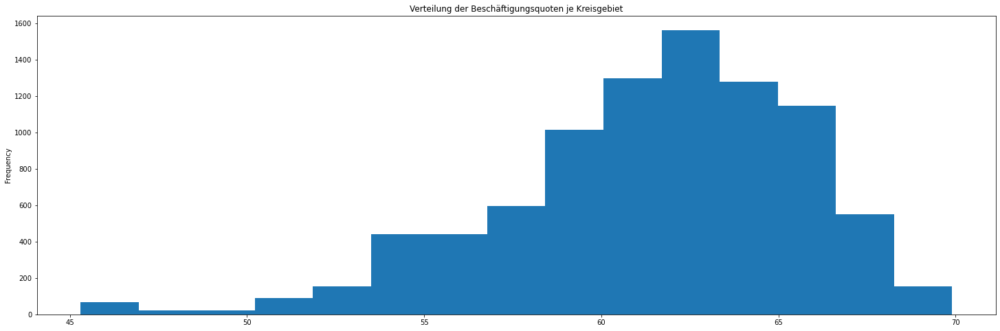

In [86]:
# Beschäftigitenquote insgesamt je Kreisgebiet
kriminalstatistik['Beschäftigungsquoten insgesamt'].plot(kind = 'hist', bins = 15, figsize = [25,8], 
                                                         title = 'Verteilung der Beschäftigungsquoten je Kreisgebiet')

Erkenntnis:
Linksschiefe Verteilung der Beschäftigungsquoten. Mittelwert liegt zwischen 60 und 65%. 
Einige wenige Kreisgebiete haben sogar Beschäftigungsquoten nahe 70%.
Auf der anderen Seite haben ebenso einige Kreisgebiete Beschäftigungsquoten < 55%.

<AxesSubplot:title={'center':'Verteilung der Beschäftigungsquoten der ausländischen Bürger je Kreisgebiet'}, ylabel='Frequency'>

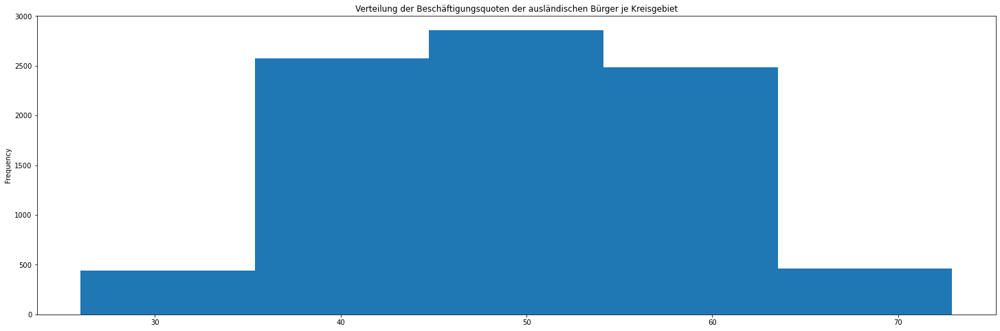

In [87]:
# Beschäftigtenquote der Ausländer je Kreisgebiet
kriminalstatistik['Beschäftigungsquoten Ausländer'].plot(kind = 'hist', figsize = [25,8], bins = 5,
                                                         title = 'Verteilung der Beschäftigungsquoten der ausländischen Bürger je Kreisgebiet')

Erkenntnis: Annähernde Normalverteilung der Beschäftigungsquoten der ausländischen Bürger je Kreisgebiet.

Der Wertebereich, also die Spanne der Beschäftigungsquote unter Ausländern, ist allerdings deutlich größer.

Sie reicht von ca. 15% bis über 70%. Der Mittelwert der Beschäftigungsquote unter Ausländern, wie im Histogramm ersichtlich, liegt bei ca. 50%, was deutlich niedriger ist, als die Beschäftigungsquote in der Gesamtbevölkerung.






### Kriminalitätsrate je Kreisgebiet in Abhängigkeit zur Beschäftigungsquote

<AxesSubplot:title={'center':'Kriminalitätsrate je Kreisgebiet in Abhängigkeit zur Beschäftigungsquote'}, xlabel='Beschäftigungsquoten insgesamt', ylabel='Kriminalitätsrate'>

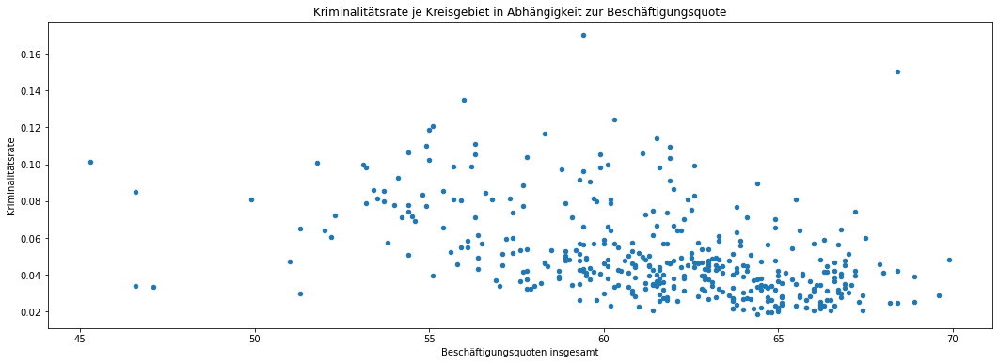

In [88]:
beschäftigung = kriminalstatistik[['Kreis_ID', 'Beschäftigungsquoten insgesamt', 'Bevölkerung insgesamt']].groupby('Kreis_ID').mean().reset_index()
fälle = kriminalstatistik[['Kreis_ID','Anzahl erfasste Faelle']].groupby('Kreis_ID').sum().reset_index()

beschäftigung_fälle = pd.merge(beschäftigung, fälle, on = 'Kreis_ID', how = 'inner')
beschäftigung_fälle['Kriminalitätsrate'] = beschäftigung_fälle['Anzahl erfasste Faelle'] / beschäftigung_fälle['Bevölkerung insgesamt']
beschäftigung_fälle.plot(kind='scatter', x = 'Beschäftigungsquoten insgesamt', y = 'Kriminalitätsrate',
                        title = 'Kriminalitätsrate je Kreisgebiet in Abhängigkeit zur Beschäftigungsquote',
                        figsize = [18,6])

Erkenntnis:

Ein Zusammenhang zwischen der Kriminalitätsrate und der Beschäftigungsquote der Gesamtbevölkerung eines Kreisgebiets kann, unter Berücksichtigung einiger Ausreißer, angenommen werden.

Es liegt ein leicht negativer Zusammenhang vor.

Je niedriger die Beschäftigungsquoten (ergo: je höher die Arbeitslosenquote), desto höher sind tendenziell die Kriminalitätsfälle pro Kopf (Kriminalitätsrate).

### Verteilung der Ausländeranteile je Kreisgebiet

Anteil der Ausländer insgesamt an der Bevölkerung insgesamt       AxesSubplot(0.125,0.125;0.227941x0.755)
Anteil der Ausländer männlich an der Bevölkerung männlich      AxesSubplot(0.398529,0.125;0.227941x0.755)
Anteil der Ausländer weiblich an der Bevölkerung weiblich      AxesSubplot(0.672059,0.125;0.227941x0.755)
dtype: object

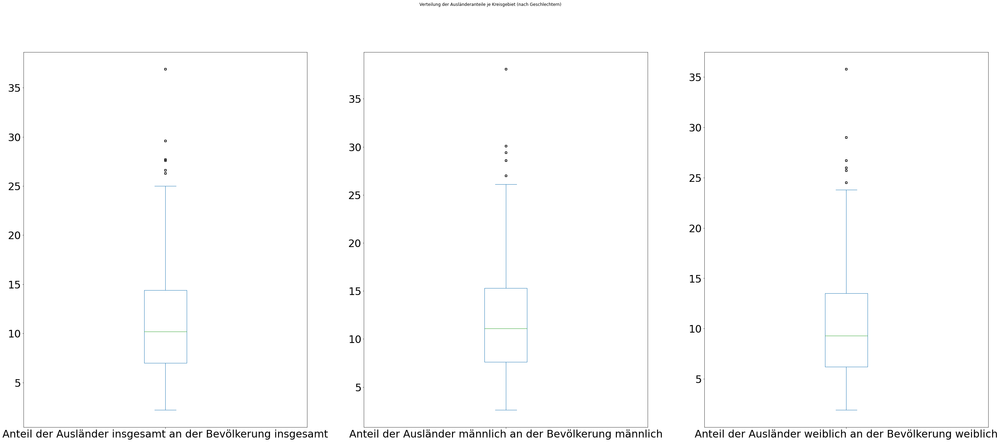

In [89]:
kriminalstatistik[migration1[0:3]].plot(kind = 'box', subplots = True, figsize = [50,20], 
                                        title = 'Verteilung der Ausländeranteile je Kreisgebiet (nach Geschlechtern)',
                                       fontsize = 30)

Erkenntnis: Die Verteilung der Ausländer (Ausländeranteil an der Gesamtbevölkerung) über alle deutsche Kreise scheint sehr unterschiedlich zu sein. Die Ausländeranteile reichen von < 5% bis hin zu > 30 %. Analog verhält es sich mit den geschlechterspezifischen Ausländeranteilen an der Gesamtbevölkerung des jeweiligen Geschlechts.

Somit scheinen ausländische Bürger sehr ungleich auf die einzelnen Kreisgebiete verteilt zu sein.

### Ausländeranteile je Bundesland

In [90]:
kriminalstatistik[[kriminal_spalten[-2], migration1[0], migration1[1], migration1[2]]]

auslaender_bundesland = kriminalstatistik[[kriminal_spalten[-2], migration1[0], migration1[1], migration1[2], 'Anteil der Nicht-EU-Ausländer an allen Ausländern', 'Anteil der EU-Ausländer an allen Ausländern']].groupby('Bundesland').mean().reset_index().sort_values('Anteil der Ausländer insgesamt an der Bevölkerung insgesamt', ascending=False)

<AxesSubplot:title={'center':'Durchschnittlicher Ausländeranteil je Bundesland'}, xlabel='Bundesland', ylabel='Rel. Anteil Ausländer an der Gesamtbevölkerung'>

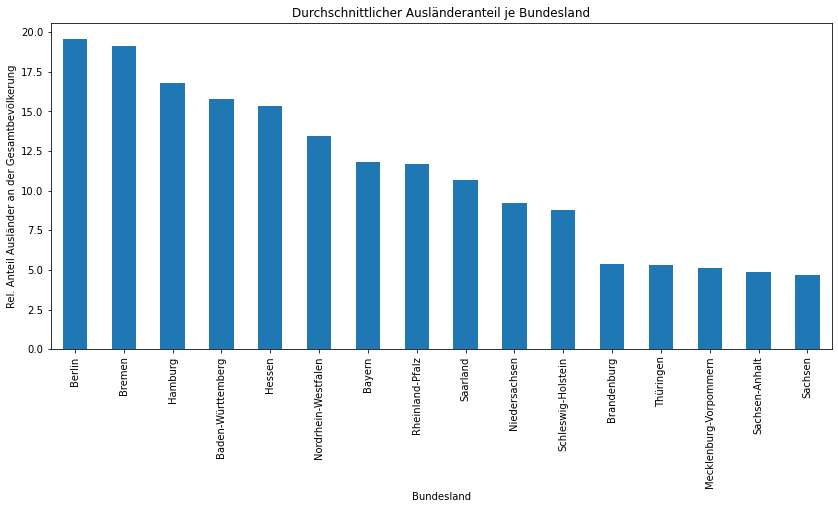

In [91]:
auslaender_bundesland.plot(kind='bar',x = 'Bundesland', y = 'Anteil der Ausländer insgesamt an der Bevölkerung insgesamt', legend = False,
                          title = 'Durchschnittlicher Ausländeranteil je Bundesland', ylabel = 'Rel. Anteil Ausländer an der Gesamtbevölkerung', figsize=[14,6])

Erkenntnis: Der Ausländeranteil ist in Berlin am Höchsten. Es folgt Bremen, Hamburg, Baden-Württemerg und Hessen. In diesen 5 Bundesländern leben fast 50% aller ausländischen Bürger in Deutschland.

### Kriminalitätsrate in Abhängigkeit zum Ausländeranteil

array([<AxesSubplot:title={'center':'Kriminalitätsrate'}, xlabel='Bundesland'>,
       <AxesSubplot:title={'center':'Anteil der Ausländer insgesamt an der Bevölkerung insgesamt'}, xlabel='Bundesland'>],
      dtype=object)

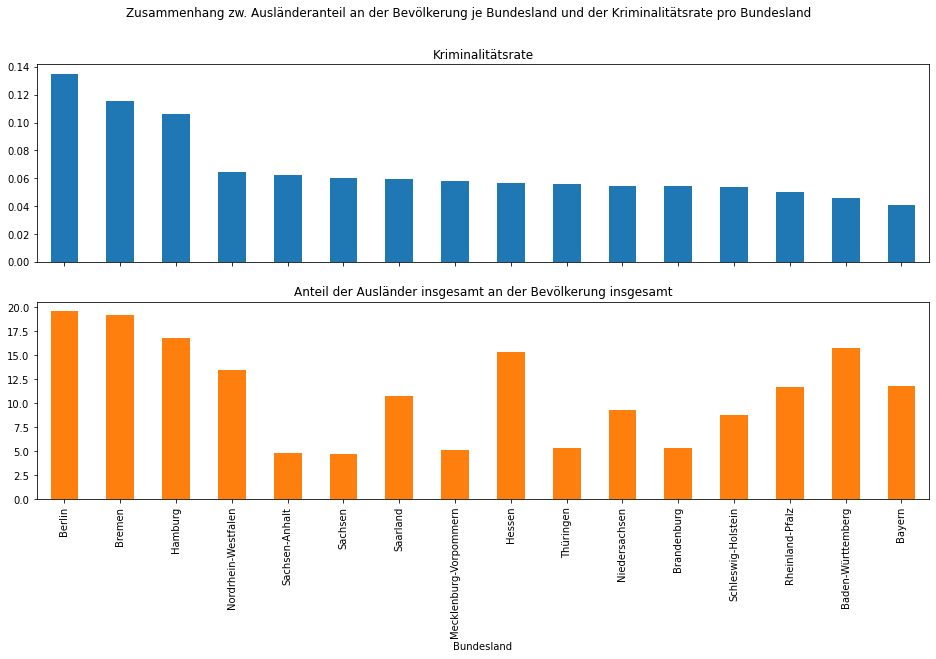

In [92]:
# Vergleich der Kriminalitätsrate je Bundesland mit dem durchschnittlichen Ausländeranteil je Bundesland
bundesl_krim = bundesl_kriminalitätsrate[['Bundesland', 'Kriminalitätsrate']]
ausl_bundesl = auslaender_bundesland[['Bundesland','Anteil der Ausländer insgesamt an der Bevölkerung insgesamt']]

krim_ausl = pd.merge(bundesl_krim , ausl_bundesl, on = 'Bundesland', how = 'inner').set_index('Bundesland')
krim_ausl.plot(kind = 'bar', title = 'Zusammenhang zw. Ausländeranteil an der Bevölkerung je Bundesland und der Kriminalitätsrate pro Bundesland',
              subplots=True, legend = False, fontsize = 10, figsize = [16,8])

Erkenntnis:

Ein Zusammenhang zw. Ausländeranteil und Kriminalitätsrate scheint zu bestehen. Die Bundesländer mit dem höchsten Ausländeranteil weisen ebenso die höchste Kriminalitätsrate auf. Es gibt Ausnahmen, z.B. Hessen, Baden-Württemberg und auch Bayern und Rheinland-Pfalz.

**Anmerkung:** Ebenso besteht ein Zusammenhang zw. verfügbarem Einkommen pro Einwohner und der Kriminalitätsrate. Ausländische Bürger haben, wie weiter oben im Rahmen der explorativen Analyse aufgezeigt, ein geringeres durchschnittliches Einkommen pro Kopf.

<AxesSubplot:title={'center':'Abhängigkeit der Kriminalitätsrate vom Ausländeranteil in der Bevölkerung deutscher Kreisgebiete'}, xlabel='Anteil der Ausländer insgesamt an der Bevölkerung insgesamt', ylabel='Fälle pro Kopf'>

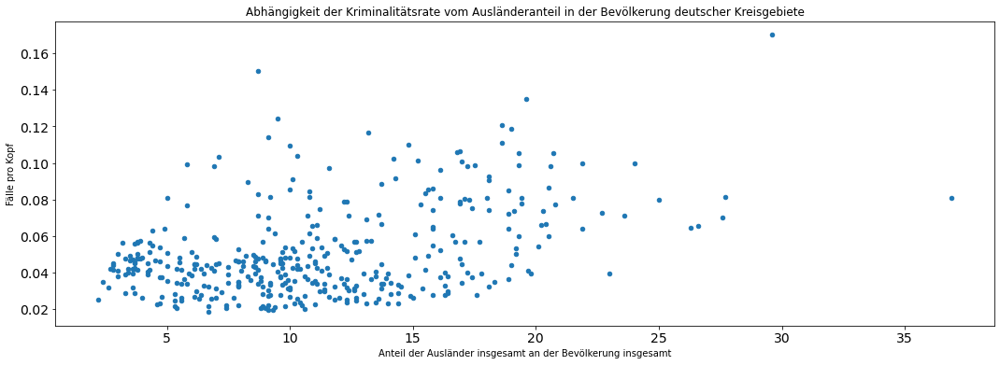

In [93]:
# Zusammenhang zwischen der Kriminalitätsrate (Anzahl erfasster Fälle je Einwohner) und des Ausländeranteils an der Bevölkerung


krim_kreis = kriminalstatistik[['Kreis_ID', 'Anzahl erfasste Faelle']].groupby(['Kreis_ID']).sum().reset_index()
ausl = kriminalstatistik[['Kreis_ID', 'Bevölkerung insgesamt', 'Anteil der Ausländer insgesamt an der Bevölkerung insgesamt']].groupby(['Kreis_ID']).mean().reset_index()

krim_ausl = pd.merge(krim_kreis, ausl, on = 'Kreis_ID', how = 'inner')
krim_ausl['Fälle pro Kopf'] = krim_ausl['Anzahl erfasste Faelle'] / krim_ausl['Bevölkerung insgesamt']

krim_ausl.plot(kind='scatter', x = 'Anteil der Ausländer insgesamt an der Bevölkerung insgesamt', y = 'Fälle pro Kopf',
              title = 'Abhängigkeit der Kriminalitätsrate vom Ausländeranteil in der Bevölkerung deutscher Kreisgebiete',
              figsize = [18,6], fontsize=14)

Erkenntnis:

Ein geringer Anteil der Ausländer an der Gesamtbevölkerung deutscher Kreisgebiete scheint, dem Scatterplot folgend, eine relativ geringe Kriminalitätsrate aufzuweisen.

Ein höherer Ausländeranteil an der Gesamtbevölkerung auf Kreisebene wirkt sich leicht negativ auf die Kriminalitätsfälle pro Kopf aus.

Auch wenn die Streuung relativ breit ist, lässt sich ein leicht positiver Zusammenhang erkennen.

Wie bereits eingangs in der Analyse einzelner Variablen des Migrationsdatensatzes (s. Kapitel 3.3) dargestellt, ist die Erwerbsquote bei ausländischen Bürgern in deutschen Kreisgebieten durchschnittlich deutlich niedriger, als die Erwerbsquote der Gesamtbevölkerung. Der Zusammenhang der Kriminalitätsrate zum rel. Anteil der Erwerbstätigen in deutschen Kreisgebieten wurde etwas weiter oben bereits aufgezeigt.

Dieser Scatterplot bestätigt diesen dreidimensionalen Zusammenhang (Ausländischer Bürger <> Geringe Erwerbstätigenquote <> Höhere Kriminalitätsrate) noch einmal.

Außerdem lässt die, ebenfalls weiter oben bereits dargestellte, Tatsache, dass bei hohen Kriminalitätsraten in geringeren Einkommensbereichen i.d.R. die Strafdelikte "Diebstahl einfach" und/oder "Straftaten gg. Asyl- und Aufenthaltsgesetze" erfasst werden, darauf schließen, dass der rel. Anteil der Tatverdächtigen, die Diebstahlsdelikte begehen, ausländisch sein könnten. Diese Hypothese gilt es im Folgenden zu überprüfen.

<AxesSubplot:title={'center':'Anteil der Nicht-EU-Ausländer an allen Ausländern je Bundesland'}, xlabel='Bundesland'>

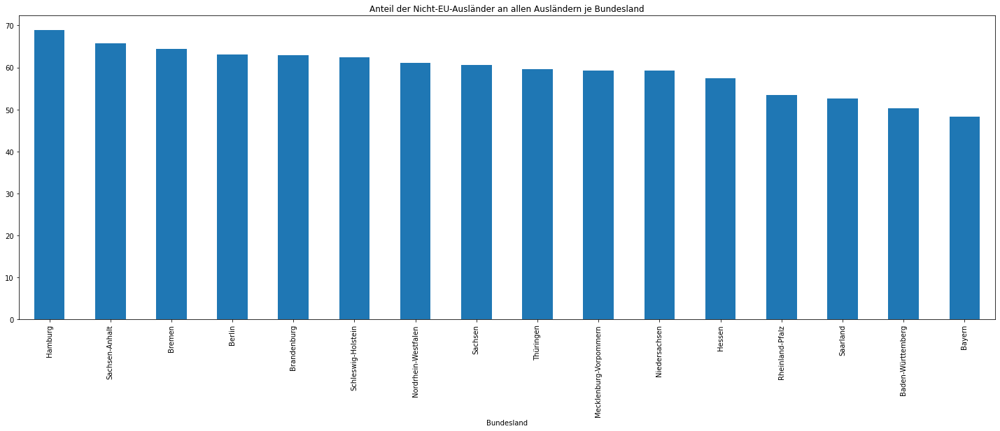

In [94]:
auslaender_bundesland = auslaender_bundesland.sort_values('Anteil der Nicht-EU-Ausländer an allen Ausländern', ascending=False)
auslaender_bundesland.plot(kind='bar', x= 'Bundesland', y = 'Anteil der Nicht-EU-Ausländer an allen Ausländern', legend = False,
                          title = 'Anteil der Nicht-EU-Ausländer an allen Ausländern je Bundesland', ylabel = '', figsize = [25,8] )

Erkenntnis: Der Anteil der Nicht-EU-Ausländer ist in Hamburg am Höchsten. Darauf folgt Sachsen-Anhalt, Bremen, Berlin und Brandenburg. Die Spanne der Werte je Bundesland reicht von durchschnittlich 50% bis hin zu fast 70%.

**Anmerkung:** Bundesländer mit hoher Kriminalitätsrate und hohem Ausländeranteil haben gleichzeitig relativ hohen Anteil an Nicht-EU-Ausländern.

<AxesSubplot:title={'center':'Anteil der EU-Ausländer an allen Ausländern'}, xlabel='Bundesland'>

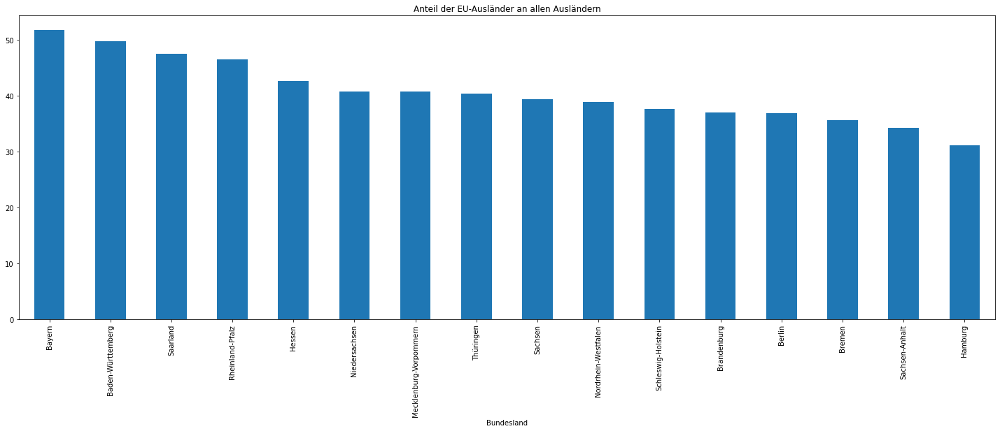

In [95]:
auslaender_bundesland = auslaender_bundesland.sort_values('Anteil der EU-Ausländer an allen Ausländern', ascending=False)
auslaender_bundesland.plot(kind='bar',x = 'Bundesland', y = 'Anteil der EU-Ausländer an allen Ausländern', legend = False,
                          title = 'Anteil der EU-Ausländer an allen Ausländern', ylabel = '', figsize = [25,8] )

Erkenntnis: Der Anteil der EU-Ausländer ist in Bayern am Höchsten. Darauf folgen Baden-Württemberg, das Saarland und Rheinland-Pfalz. Die Spanne der Werte reicht hier von knapp > 30% (im Durchschnitt über alle Kreise der Bundesländer) bis hin zu etwas > 50%.

**Anmerkung**: In Bundesländern, wie Bayern, Baden-Württemberg und Rheinland-Pfalz, mit überdurchschnittlichem Ausländeranteil und trotzdem relativ geringer Kriminalitätsrate leben vorwiegend (zu größeren Teilen) Ausländer aus EU-Staaten stammend.

In [96]:
auslaender_aufenthaltsdauer = kriminalstatistik[['Bundesland','Anteil Ausländer Aufenthaltsdauer unter 2 Jahre',
 'Anteil Ausländer Aufenthaltsdauer 2 bis unter 10 Jahre',
 'Anteil Ausländer Aufenthaltsdauer 10 bis unter 25 Jahre',
 'Anteil Ausländer Aufenthaltsdauer 25 Jahre und mehr']]
auslaender_aufenthaltsdauer_aggr = auslaender_aufenthaltsdauer[1:].groupby('Bundesland').mean()

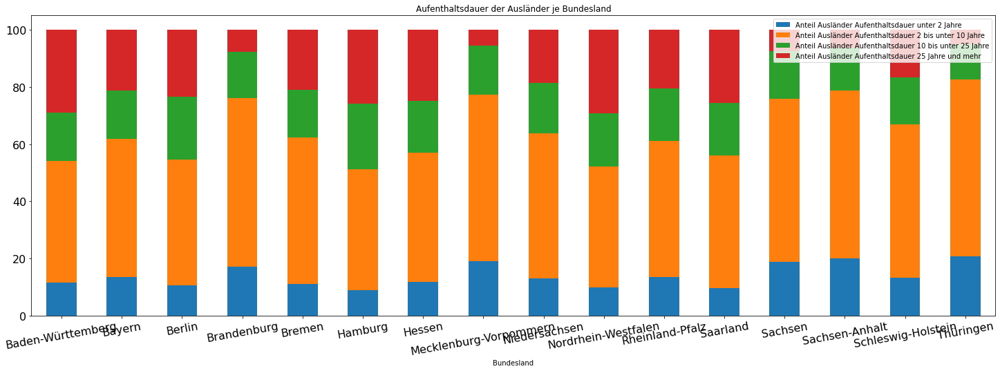

In [97]:
fig = auslaender_aufenthaltsdauer_aggr.plot.bar(rot=10, stacked = True, subplots=False, figsize = [25,8], fontsize = 16,
                                               title = 'Aufenthaltsdauer der Ausländer je Bundesland')
fig.legend(loc=1)  

Erkenntnis: In ziemlich allen Bundesländern ist der dominierende Anteil der Ausländer mit einer Aufenthaltsdauer von 2-10 Jahren.

Auffällig niedrig ist der Anteil der Ausländer mit einer Aufenthaltsdauer von > 25 Jahren in Meckenburg-Vorpommern, Sachsen und Sachsen-Anhalt. Auch in Brandenburg ist diese Gruppe mit einem nur relativ geringen Anteil vertreten.

Gleichermaßen sind in diesen Bundesländern jene Ausländeranteile mit einer Aufenthaltsdauer von > 2 Jahren etwas erhöht.

## Analyse der Arbeitslosenstatistik

In [98]:
# Sub-Datasets Arbeitslose


df_landkreis_1 = df_landkreis.reset_index(drop=False)

# Sub-Dataset: Arbeitslose insgesamt je Landkreis/ Stadt inkl. Angabe Bundesland
df_arbeitslose_ins_land_bund = df[['Stadt-/Landkreis',
                           'Bundesland',
                           'Arbeitslose Anzahl insgesamt']]

# Sub-Dataset: Arbeitslose je Kategorie je Landkreis/ Stadt inkl. Angabe Bundesland
df_arbeitslose_kat_land_bund = df[['Stadt-/Landkreis',
                                   'Bundesland',
                                   'Arbeitslose Anzahl insgesamt',
                                   'Arbeitslose Anzahl Ausländer',
                                   'Arbeitslose Anzahl Langzeitarbeitslos',
                                   'Arbeitslose Anzahl Schwerbehindert',
                                   'Arbeitslose Anzahl Alter zwischen 15 bis unter 20 Jahre',
                                   'Arbeitslose Anzahl Alter zwischen 20 bis unter 55 Jahre',
                                   'Arbeitslose Anzahl Alter zwischen 55 bis unter 65 Jahre']]

# Sub-Dataset: Arbeitslose je Kategorie je Bundesland
df_arbeitslose_kat_bund = pd.DataFrame(df_arbeitslose_kat_land_bund.groupby('Bundesland').mean()).\
                          sort_values('Arbeitslose Anzahl insgesamt',ascending = False).reset_index(drop=False)

### Verteilung der Anzahl der Arbeitslosen je Kategorie je Kreisgebiet

<AxesSubplot:title={'center':'Arbeitslosenverteilung je Kreisgebiet in Deutschland'}>

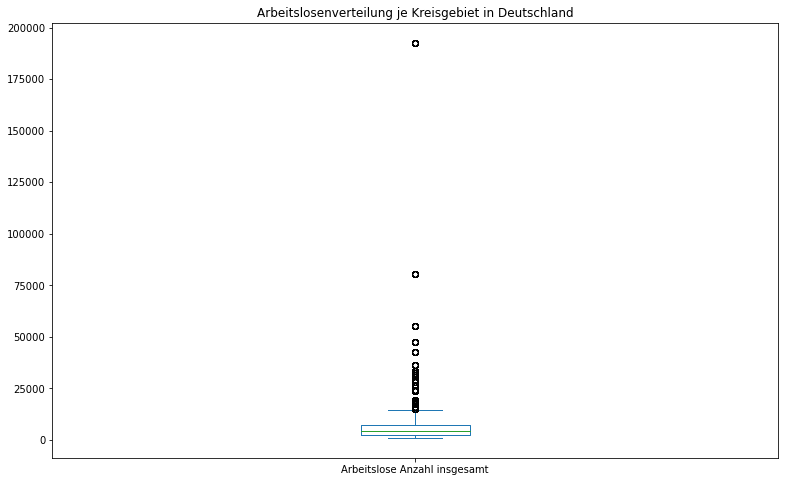

In [99]:
# Verteilung der Anzahl der Arbeitslosen insgesamt
kriminalstatistik[arbeitslosen_numerisch[0]].plot(kind='box',figsize = (13,8),
                                                title = 'Arbeitslosenverteilung je Kreisgebiet in Deutschland')

Es lässt sich feststellen, dass Kreise / Städte ab einer Arbeitslosenanzahl von ca. 20.000 die Außreißer am oberen Ende bilden. Daneben wird ein sehr starker Ausreißer von knapp unter 200.000 Arbeitslose festgestellt. Die Spanne der Arbeitslosen reicht von wenigen Hundert bis hin zu ca. 20.000 Menschen. Somit handelt es sich dabei um eine extrem rechtsschiefe Verteilung.

### Durchschnittliche Anzahl Arbeitslose je Bundesland

<AxesSubplot:title={'center':'Durchschnittliche Anzahl Arbeitsloser in deutschen Bundesländern im Jahr 2020'}, xlabel='Bundesland'>

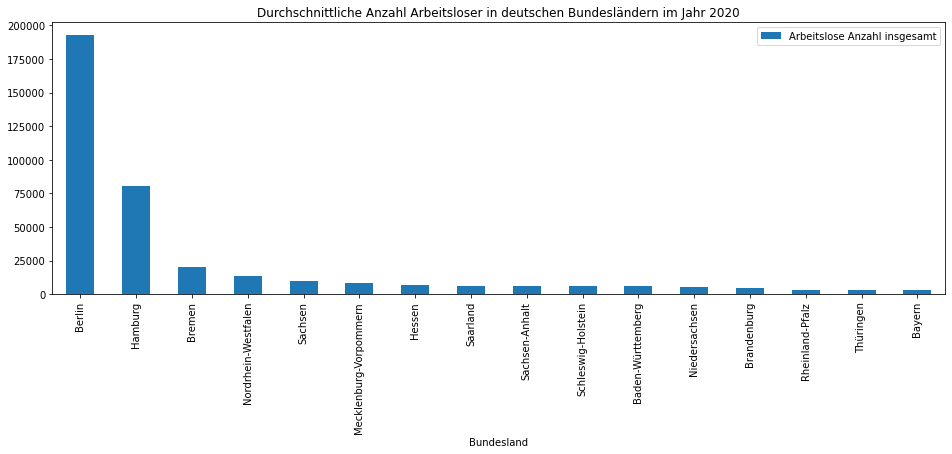

In [100]:
arbeitslose_bundesland = df_arbeitslose_ins_land_bund[['Bundesland', 'Arbeitslose Anzahl insgesamt']].groupby('Bundesland')\
                        .mean().reset_index().sort_values('Arbeitslose Anzahl insgesamt',ascending = False)

arbeitslose_bundesland.plot(kind='bar', x='Bundesland',y='Arbeitslose Anzahl insgesamt', 
                            title = 'Durchschnittliche Anzahl Arbeitsloser in deutschen Bundesländern im Jahr 2020',
                           figsize=[16,5])

Erkenntnis: Führend im Ranking der durchschnittlichen Anzahl der Arbeitslosen in einzelnen Kreisgebieten Deutschland ist mit weitem Abstand Berlin, welches damit den Ausreißer aus 3.1 begründet. Die Stadtstaaten Hamburg und Bremen folgen, jedoch mit weitem Abstand. 

Die geringeste Arbeitslosenanzahl haben Thüringen und Bayern.

Insgesamt bewegt sich die Anzahl der Arbeitslosen aber - trotz Corona im Jahr 2020 - auf einem eher niedrigen Niveau.

**Anmerkung:** Das Ranking der Kriminalitätsraten führen ebenfalls Berlin, Hamburg und Bremen an. Es lässt sich daher vermuten, dass ein Zusammenhang zwischen Arbeitslosenzahlen und Kriminalitätsraten bzw. erfassten Straftatfällen herrscht. Dies soll im Folgenden nun noch einmal kurz untersucht werden.

### Anzahl erfasster Straftaten in Abhängigkeit zur Anzahl der Arbeitslosen je Kategorie

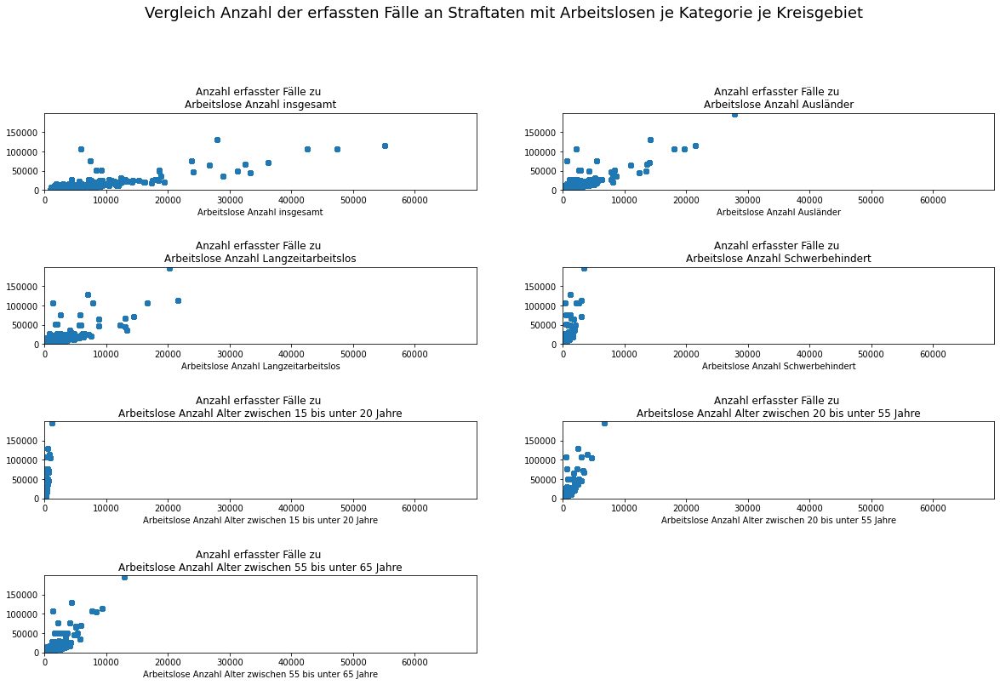

In [101]:
# Vergleich Arbeitslose je Kategorie zur Anzahl erfasster Fälle

df_landkreis_1 = df_landkreis.reset_index(drop=False)
df_arbeitslose_kat_landkreis_1 = pd.merge(df_arbeitslose_kat_land_bund,df_landkreis_1,on=['Stadt-/Landkreis'])

df_arbeitslose_list = df_arbeitslose_kat_landkreis_1.iloc[:,2:9]


## Plot

count=1
plt.subplots(figsize=(20, 25))
plt.subplots_adjust(hspace=1)
plt.suptitle('Vergleich Anzahl der erfassten Fälle an Straftaten mit Arbeitslosen je Kategorie je Kreisgebiet', fontsize=18, y=0.95)

for i in df_arbeitslose_list.columns:
    ax = plt.subplot(8,2,count)
    x = df_arbeitslose_kat_landkreis_1[i]
    y = df_arbeitslose_kat_landkreis_1['Anzahl erfasste Faelle']
    plt.scatter(x,y)
    
    ax.set_xlabel(i)
    ax.set_title('Anzahl erfasster Fälle zu '+'\n'+i)
    ax.set_xlim([0,70000])
    ax.set_ylim([0,200000])
    plt.yticks(np.arange(0, 200000, 50000.0))
    plt.xticks(np.arange(0, 70000, 10000.0))
    count+=1

plt.show()

<AxesSubplot:title={'center':'Kriminalitätsrate in Abhängigkeit zur Arbeitslosenquote bezogen auf alle zivilen Erwerbspersonen'}, xlabel='Arbeitslosenquote Prozent bezogen auf alle zivilen Erwerbspersonen', ylabel='Fälle pro Person'>

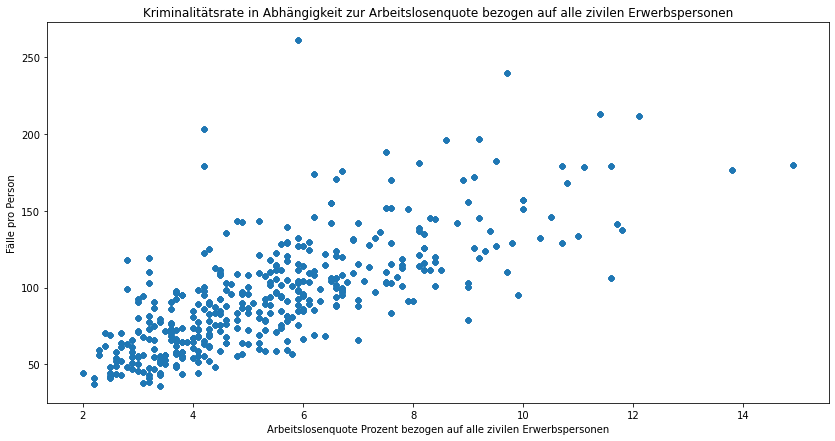

In [102]:
# Kriminalitätsrate in Abhängigkeit zur Arbeitslosenquote bezogen auf alle zivilen Erwerbspersonen

krimi_kreis = df[['Kreis_ID', 'Anzahl erfasste Faelle']].groupby('Kreis_ID').sum().reset_index()
arbeitslosenquote_erwerbspersonen_kreis = df[['Kreis_ID','Erwerbstätige im Jahresdurchschnitt Insgesamt 1000',
                                              'Arbeitslosenquote Prozent bezogen auf alle zivilen Erwerbspersonen']]
krimi_arbeitslosenquote_pp = pd.merge(krimi_kreis, arbeitslosenquote_erwerbspersonen_kreis, on = 'Kreis_ID', how = 'inner')
krimi_arbeitslosenquote_pp['Fälle pro Person'] = krimi_arbeitslosenquote_pp['Anzahl erfasste Faelle']/krimi_arbeitslosenquote_pp['Erwerbstätige im Jahresdurchschnitt Insgesamt 1000']

krimi_arbeitslosenquote_pp.plot(kind = 'scatter', x = 'Arbeitslosenquote Prozent bezogen auf alle zivilen Erwerbspersonen',
                               y = 'Fälle pro Person', title = 'Kriminalitätsrate in Abhängigkeit zur Arbeitslosenquote bezogen auf alle zivilen Erwerbspersonen',
                               figsize = [14,7])

Erkenntnis: Wie bereits oben kurz erwähnt, lässt sich ein Zusammenhang zwischen der Anzahl der Arbeitslosen und der Anzahl der erfassten Fälle an Straftaten feststellen. Dies ist sowohl über die einzelnen Kategorien der Arbeitslosenzahlen als auch beim Vergleich der Kriminalitätsrate in Abhängigkeit zur Arbeitslosenquote bezogen auf die zivilen Erwerbspersonen zu erkennen.

Es liegt insgesamt ein positiver Zusammenhang vor:
Liegt in einem Kreis oder Stadt eine erhöhte Arbeitslosigkeit vor, so werden auch mehr Straftaten erfasst. Eine niedrige Arbeitslosenquote führt zu einer geringeren Kriminalitätsrate.

## Analyse der Daten zur Bundestagswahl 2021

In [103]:
# Sub-Datasets Wahl

wahl_numerisch = ['Wahlbeteiligung Prozent',
'Wahlberechtige Anzahl',
'Gültige Zweitstimmen Parteien CDU/CSU Anzahl',
'Gültige Zweitstimmen Parteien SPD Anzahl',
'Gültige Zweitstimmen Parteien GRÜNE Anzahl',
'Gültige Zweitstimmen Parteien FDP Anzahl',
'Gültige Zweitstimmen Parteien DIE LINKE Anzahl',
'Gültige Zweitstimmen Parteien AfD Anzahl']

# Sub-Dataset: Anzahl Wahlberechtige insgesamt je Stadt-/Landkreis und Bundesland
df_wahl_berechtigt_insg = df[['Stadt-/Landkreis',
                           'Bundesland',
                           'Wahlberechtige Anzahl']].groupby(['Stadt-/Landkreis','Bundesland']).mean().reset_index()

# Sub-Dataset: Anzahl gültige Zweitstimmen insgesamt je Stadt-/Landkreis und Bundesland
df_wahl_stimmen_insg = df[['Stadt-/Landkreis','Bundesland','Gültige Zeitstimmen Anzahl']].drop_duplicates()
df_wahl_stimmen_insg.rename(columns={'Gültige Zeitstimmen Anzahl':'Gültige Zweitstimmen Anzahl'})

# Sub-Dataset: Anzahl gültige Zweitstimmen je Partei insgesamt je Stadt-/Landkreis und Bundesland
df_wahl_stimmen_partei_bund_land = df[['Stadt-/Landkreis',
                               'Bundesland',
                               'Gültige Zweitstimmen Parteien CDU/CSU Anzahl',
                               'Gültige Zweitstimmen Parteien SPD Anzahl',
                               'Gültige Zweitstimmen Parteien GRÜNE Anzahl',
                               'Gültige Zweitstimmen Parteien FDP Anzahl',
                               'Gültige Zweitstimmen Parteien DIE LINKE Anzahl',
                               'Gültige Zweitstimmen Parteien AfD Anzahl']].drop_duplicates()

# Sub-Dataset: Anzahl gültiger Zweitstimmen je Bundesland
df_wahl_stimmen_bund_insg = df_wahl_stimmen_insg.groupby(['Bundesland']).sum().reset_index(drop=False)

# Sub-Dataset: Anzahl gültiger Zweitstimmen je Partei insgesamt je Bundesland
df_wahl_stimmen_partei_bund_insg = df_wahl_stimmen_partei_bund_land.groupby(['Bundesland']).sum().reset_index(drop=False)

# Sub-Dataset unstacked: Anzahl gültiger Zweistimmen insgesamt je Partei je Bundesland

df_wahl_stimmen_partei_bund_unstack = df_wahl_stimmen_partei_bund_insg.set_index(['Bundesland']).unstack().reset_index()
df_wahl_stimmen_partei_bund_unstack_group = df_wahl_stimmen_partei_bund_unstack.groupby(['level_0','Bundesland']).sum().sort_values(0,ascending=False).reset_index(drop=False)
df_wahl_stimmen_partei_bund_unstack_group = df_wahl_stimmen_partei_bund_unstack_group.rename(columns={'level_0':'Parteien',0:'Anzahl Zweitstimmen'})
df_wahl_stimmen_partei_bund_unstack_group['Parteien'] = df_wahl_stimmen_partei_bund_unstack_group['Parteien'].str.replace('Anzahl','')
df_wahl_stimmen_partei_bund_unstack_group['Parteien'] = df_wahl_stimmen_partei_bund_unstack_group['Parteien'].str.replace('Gültige Zweitstimmen Parteien','')

# Sub-Dataset unstacked: Anzahl gültiger Zweistimmen insgesamt je Partei 

df_wahl_stimmen_partei_unstack_group = df_wahl_stimmen_partei_bund_unstack_group.groupby(['Parteien']).sum().sort_values('Anzahl Zweitstimmen',ascending=False).reset_index(drop=False)
df_wahl_stimmen_partei_unstack_group['Parteien'] = df_wahl_stimmen_partei_unstack_group['Parteien'].str.replace('Anzahl','')
df_wahl_stimmen_partei_unstack_group['Parteien'] = df_wahl_stimmen_partei_unstack_group['Parteien'].str.replace('Gültige Zweitstimmen Parteien','')


### Verteilung der Zweitstimmen je Kreis / Stadt

Gültige Zweitstimmen Parteien CDU/CSU Anzahl         AxesSubplot(0.125,0.125;0.110714x0.755)
Gültige Zweitstimmen Parteien SPD Anzahl          AxesSubplot(0.257857,0.125;0.110714x0.755)
Gültige Zweitstimmen Parteien GRÜNE Anzahl        AxesSubplot(0.390714,0.125;0.110714x0.755)
Gültige Zweitstimmen Parteien FDP Anzahl          AxesSubplot(0.523571,0.125;0.110714x0.755)
Gültige Zweitstimmen Parteien DIE LINKE Anzahl    AxesSubplot(0.656429,0.125;0.110714x0.755)
Gültige Zweitstimmen Parteien AfD Anzahl          AxesSubplot(0.789286,0.125;0.110714x0.755)
dtype: object

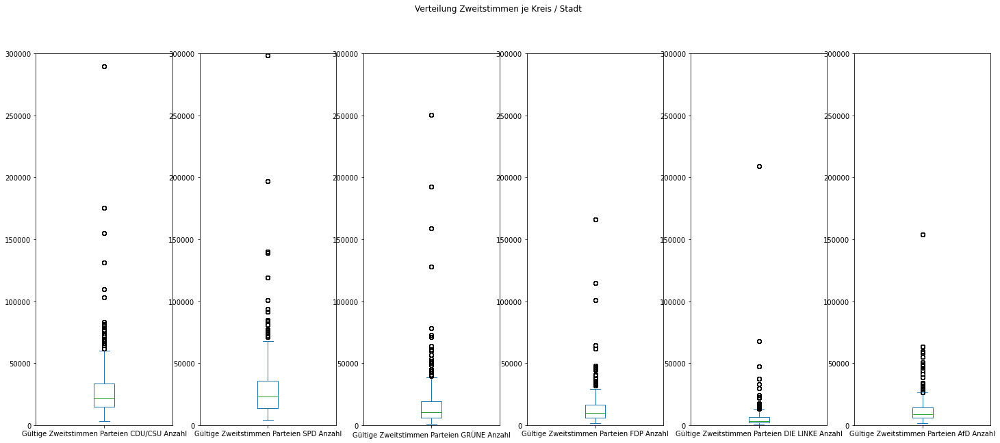

In [104]:
kriminalstatistik[wahl_numerisch[2:8]].plot(kind='box',subplots = True, figsize = [25,10],
                                            ylim = (0,300000), title = 'Verteilung Zweitstimmen je Kreis / Stadt')

Erkenntnis: Die Verteilung der Zweitstimmen je Partei der vergangenen Bundestagswahl über die deutschen Kreise und Städte ist unterschiedlich. Besitzen die großen Volksparteien (CDU/CSU und SPD) eine große Spanne (<50.000 bis hin zu > 175.000 Stimmen), verringert sich diese bei den kleineren Parteien deutlich (z.B. AfD: < 75.000 insgesamt).

### Anzahl der Zweitstimmen je Partei je Bundesland

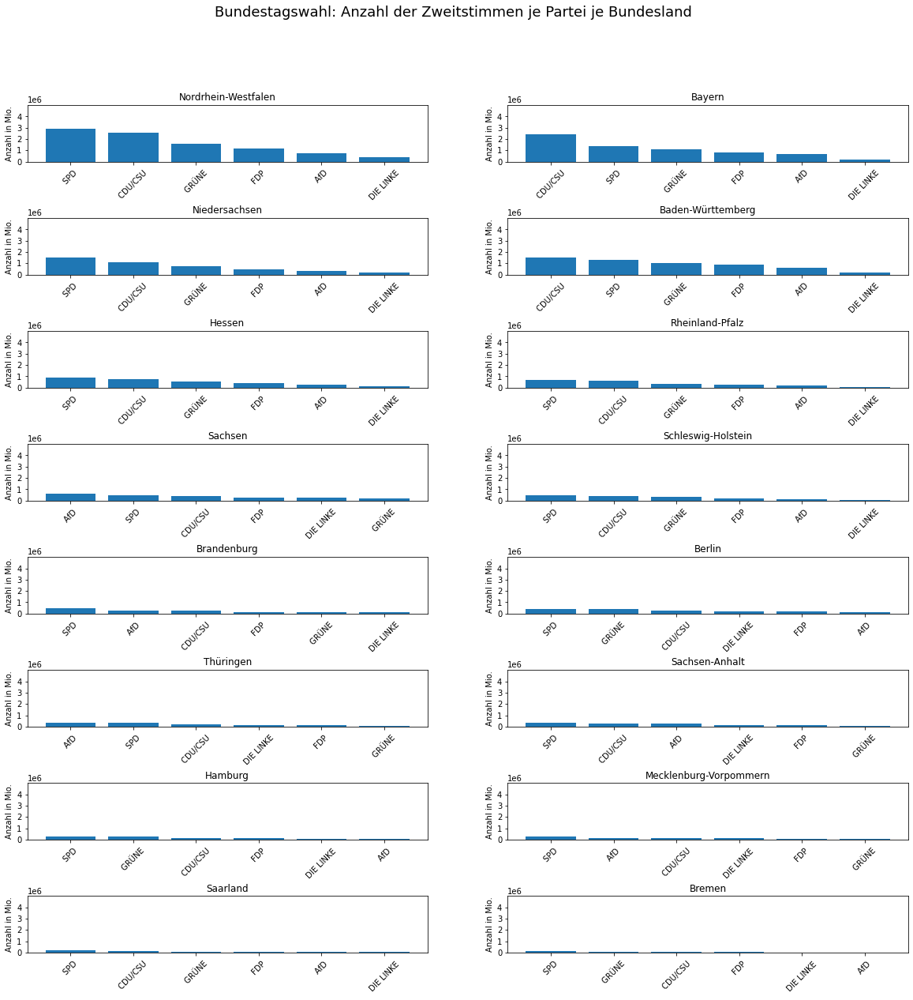

In [105]:
# Anzahl der Zweitstimmen je Partei je Bundesland

df_wahl_land_list = df_wahl_stimmen_partei_bund_unstack_group['Bundesland'].drop_duplicates().tolist()

## Plot

plt.figure(figsize=(20,25))
plt.subplots_adjust(hspace=1)
plt.suptitle('Bundestagswahl: Anzahl der Zweitstimmen je Partei je Bundesland', fontsize=18, y=0.95)


for n, bundesland_list in enumerate(df_wahl_land_list):
    ax = plt.subplot(10,2,n+1)
    
    df0=df_wahl_stimmen_partei_bund_unstack_group[df_wahl_stimmen_partei_bund_unstack_group['Bundesland']==bundesland_list]
    
    ax.bar(df0['Parteien'],df0['Anzahl Zweitstimmen'])
    ax.set_title(bundesland_list)
    ax.set_xlabel("")
    ax.set_ylabel("Anzahl in Mio.")
    ax.set_ylim([0,5000000])
    plt.yticks(np.arange(0, 5000000, 1000000.0))
    ax.tick_params('x',labelrotation=45) 
    
plt.show()

### Wahlbeteiligung je Bundesland

Durchschnittliche Wahlbeteiligung in Gesamt DE: 75.05368948189391 %


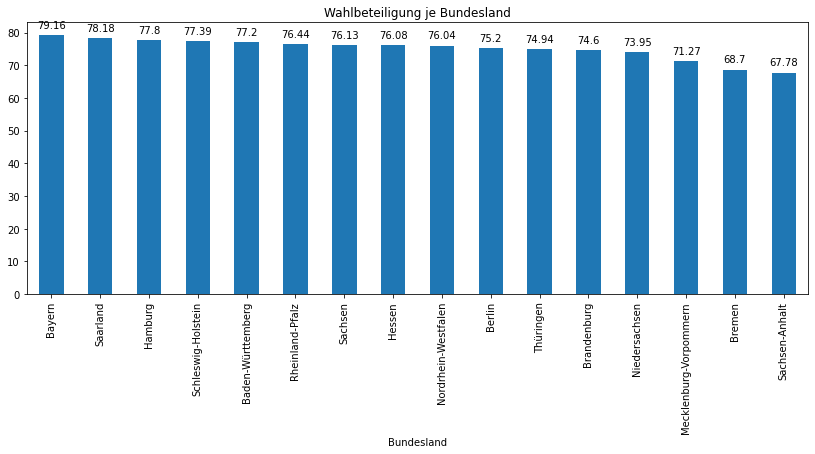

In [106]:
# Wahlbeteiligung je Bundesland

wahlbeteiligung_bund = df[['Bundesland','Wahlbeteiligung Prozent']].groupby('Bundesland').mean().reset_index().sort_values('Wahlbeteiligung Prozent',ascending = False)

ax = wahlbeteiligung_bund.plot(kind='bar',figsize = [14,5], title = 'Wahlbeteiligung je Bundesland',x = 'Bundesland',
                          y = 'Wahlbeteiligung Prozent', legend = False)

for p in ax.patches:
    ax.annotate(np.round(p.get_height(),decimals=2),(p.get_x()+p.get_width()/2., p.get_height()),ha='center',va='center',xytext=(0, 10),textcoords='offset points')

wahlbeteiligung_durchschnitt_gesamt = wahlbeteiligung_bund.iloc[:,1].sum()/16
print('Durchschnittliche Wahlbeteiligung in Gesamt DE: ' + str(wahlbeteiligung_durchschnitt_gesamt) + ' %')

Insgesamt ist eine recht hohe Wahlbeteiligung zu verzeichnen. Mit Ausnahme von Bremen und Sachsen-Anhalt liegen alle Bundesländer über einer 70% Wahlbeteiligung.

### Vergleich Anzahl Zweitstimmen zur Anzahl der erfassten Straftaten

<AxesSubplot:title={'center':'Anzahl erfasster Straftaten in Abhängigkeit zu den gültigen Zweitstimmen der Bundestagswahl'}, xlabel='Anzahl gültiger Zweitstimmen', ylabel='Anzahl erfasste Faelle'>

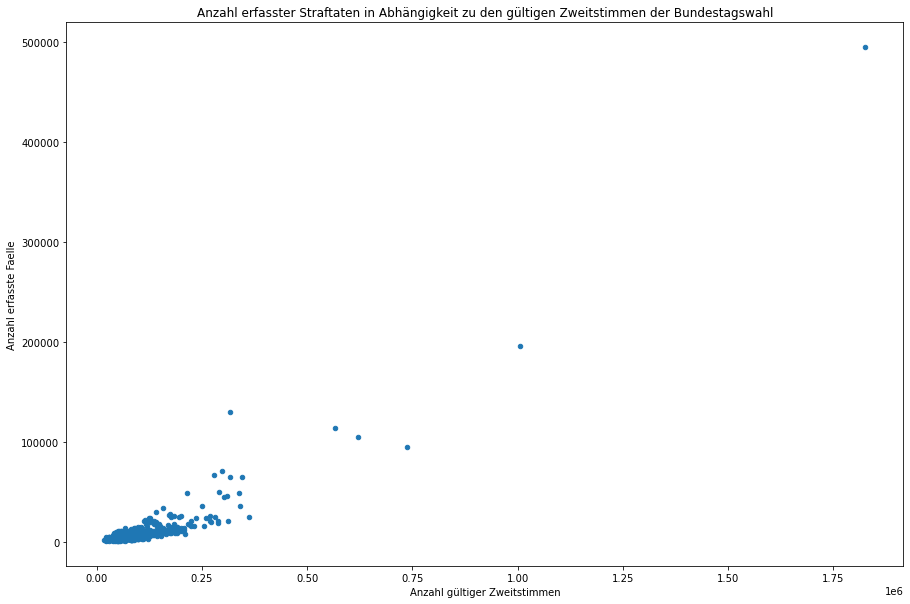

In [107]:
# Zusammenhang zwischen der Anzahl der erfassten Straftaten und der Anzahl der gültigen Zweitstimmen

kriminalität_land = df[['Kreis_ID', 'Anzahl erfasste Faelle']].groupby('Kreis_ID').sum().reset_index()
wahl_land = df[['Kreis_ID', 'Gültige Zeitstimmen Anzahl']].groupby('Kreis_ID').mean().reset_index()
kriminalität_land_wahl = pd.merge(kriminalität_land, wahl_land, on = 'Kreis_ID', how = 'inner')

kriminalität_land_wahl.plot(kind='scatter', x = 'Gültige Zeitstimmen Anzahl', y = 'Anzahl erfasste Faelle',
                           title = 'Anzahl erfasster Straftaten in Abhängigkeit zu den gültigen Zweitstimmen der Bundestagswahl',
                           figsize = [15,10], xlabel = 'Anzahl gültiger Zweitstimmen')

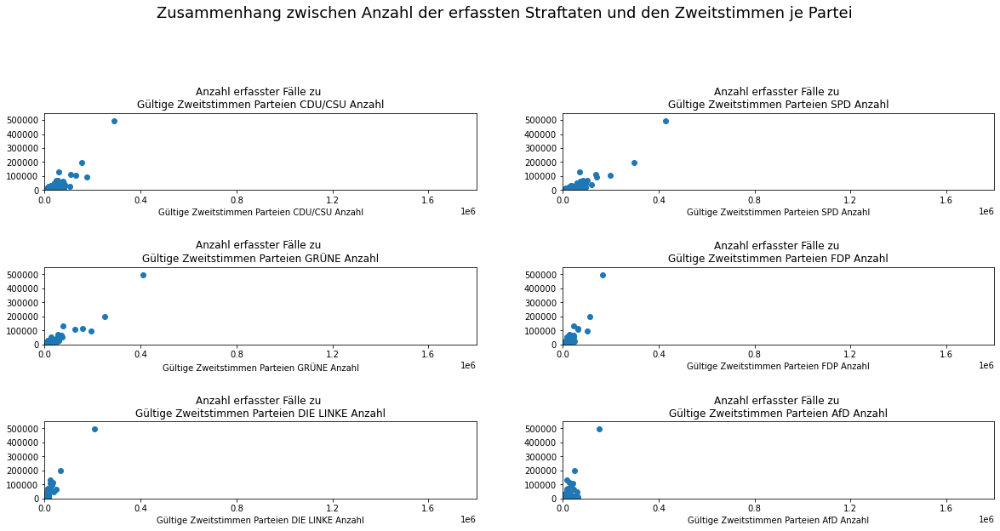

In [108]:
# Vergleich Anzahl Zweitstimmen je Partei zur Anzahl erfasster Fälle

wahl_stimmen = df[['Kreis_ID',
                  'Gültige Zweitstimmen Parteien CDU/CSU Anzahl',
                  'Gültige Zweitstimmen Parteien SPD Anzahl',
                  'Gültige Zweitstimmen Parteien GRÜNE Anzahl',
                  'Gültige Zweitstimmen Parteien FDP Anzahl',
                  'Gültige Zweitstimmen Parteien DIE LINKE Anzahl',
                  'Gültige Zweitstimmen Parteien AfD Anzahl']].groupby('Kreis_ID').mean().reset_index()
kriminalität_land_wahl_stimmen = pd.merge(kriminalität_land, wahl_stimmen, on = 'Kreis_ID', how = 'inner')

df_Parteien_list = wahl_stimmen.iloc[:,1:7]

## Plot

count=1
plt.subplots(figsize=(20, 25))
plt.subplots_adjust(hspace=1)
plt.suptitle('Zusammenhang zwischen Anzahl der erfassten Straftaten und den Zweitstimmen je Partei', fontsize=18, y=0.95)

for i in df_Parteien_list.columns:
    ax = plt.subplot(8,2,count)
    y = kriminalität_land_wahl_stimmen['Anzahl erfasste Faelle']
    x = kriminalität_land_wahl_stimmen[i]
    plt.scatter(x,y)
    
    ax.set_xlabel(i)
    ax.set_title('Anzahl erfasster Fälle zu '+'\n'+i)
    ax.set_ylim([0,550000])
    ax.set_xlim([0,1800000])
    plt.yticks(np.arange(0, 550000, 100000.0))
    plt.xticks(np.arange(0, 1800000, 400000.0))
    count+=1

plt.show()


Erkenntnisse: 

Grundsätzlich: Mit steigender Wahlbeteiligung (= Zunahme der gültigen Zweitstimmen) nimmt auch die Anzahl der Straftaten zu.
In der Detailbetrachtung der Parteien kann jedoch nicht direkt  eine Partei identifiziert werden, die  als absoluter Treiber von steigenden Straftatfällen hervorsticht. In allen Parteien nehmen mit zunehmender Anzahl Zweitstimmen auch die erfassten Fälle zu.

Ein Zusammenhang zwischen Wählerstimmen und steigenden Kriminalitätsfällen scheint zwar vorzuliegen, kann jedoch nicht ausreichend begründet werden.

# Fazit 

Die Kriminalitätsrate (Anzahl erfasster Straftaten pro Einwohner) ist in Berlin, Bremen und Hamburg mit Abstand am Höchsten. Sie werden gefolgt von Nordrhein-Westfalen und Sachsen-Anhalt, während Nordrhein-Westfalen auf Ebene der Bundesländer der Spitzenreiter hinsichtlich der absoluten Anzahl Straftaten im Jahr 2020 war. Durch die Betrachtung der Kriminalitätsrate (Anzahl erfasste Fälle je Einwohner) wird das Bild der absoluten Anzahl Straftaten relativ im Verhältnis zur Größe (Bevölkerungsanzahl) betrachtet, was den Vergleich zwischen einzelnen Bundesländern und Kreisgebieten in Deutschland vereinfacht.

Verschafft man sich einen Überbklick über die Anzahl der erfassten Straftaten je Straftatdelikt, wird deutlich, dass ca. 5 Straftatdelikte mehr als 60% aller Straftaten im Bundesgebiet verursachen. Die TOP-5-Straftatdelikte sind:

1. Straßenkriminalität (20,7%)
2. Betrug (14,8%)
3. Sachbeschädigung (11,7%)
4. Einfache Körperverletzung (7,6%)
5. Rauschgiftdelikte (7,3%)

Hinsichtlich der Kriminalitätsrate ist weiterhin auffällig, dass insbesondere die Mitte und der Süden von Deutschland in nahezu allen Kreisgebieten eine außerordentlich geringe Krmiminalitätsrate aufweisen.

Hinsichtlich der Tatverdächtigen über alle Straftatdelikte hinweg lässt sich erkennen, dass insbesondere männliche Personen straffällig werden. Dennoch gibt es die eine oder andere Straftat, die zu größeren Teilen auch von weiblichen Personen begangen werden bzw. bei denen weibliche Tatverdächtige in Frage kommen. Insbesondere bei Delikten wie "Betrug" und "einfachem Diebstahl" lässt sich vermehrte Frauenbeteiligung feststellen. Dennoch haben auch bei diesen Straftatdelikten, im direkten Vergleich, die Männer immer noch die Nase vorn.

Die Aufklärungsquote je Straftatdelikt im gesamten Bundesgebiet ist bei den Delikten "Einbruchdiebstahl", "Straßenkriminalität" und "Sachbeschädigung" mit Abstand am niedrigsten und liegt unter 30%. Hier lässt sich bereits ein zu vermutender Zusammenhang zur Kriminalitätsrate bzw. absoluten Anzahl an Straftaten in diesen Delikttypen erkennen. Tendenziell sind die Anzahl der erfassten Straftaten bei Delikttypen mit hoher Aufklärungsquote etwas geringer.

Betrachtet man die Einkommensverteilung über alle Kreisgebiete bzw. Bundesländer in Deutschland, stellt man fest, dass die Spanne der Einkommen pro Kopf auf Kreisebene von ca. 17.000€ bis hin zu 42.000€ reicht. Eine extreme Ungleichverteilung auf Kreisebene in Deutschland. Zieht man nun Vergleiche zwischen der Kriminalitätsrate und der durchschnittlich verfügbaren Einkommen in Deutschland auf Kreisebene, stellt man fest, dass ein leichter Zusammenhang zw. Kriminalität und Einkommen vermutet werden kann. Je höher das Einkommen pro Kopf in einem Kreisgebiet zu sein scheint, desto tendenziell niedriger ist die Kriminalitätsrate.

In diesem Zusammenhang ist es nicht verwunderlich, dass ebenso eine Korrelation der Kriminalitätsrate auf Kreisebene in Deutschland mit der Beschäftigtenquote/Arbeitslosenquote der Bürgerinnen und Bürger einhergeht. Das durchschnittliche verfügbare Einkommen pro Kopf wird sicher stark von der Arbeitslosenquote/Beschäftigtenquote im Kreisgebiet beeinflusst. Entsprechend liegt zw. der Kriminalitätsrate und der Beschäftigtenquote auf Kreisgebietsebene in Deutschland ein negativer Zusammenhang vor. Eine steigende Beschäftigtenquote / sinkende Arbeitslosenquote führt zu tendenziell weniger Kriminalitätsfällen und einer geringeren Kriminalitätsrate. Diese Annahme bestätigt auch die Analyse der Daten zu den Arbeitslosen: eine steigende Anzahl an Arbeitslosen in einem Kreis geht direkt mit einem Anstieg der Kriminalitätsrate einher.

In diesem Kontext ist es ebenso interessant, die durchschnittliche Beschäftigtenquote der Gesamtbevölkerung und durchschnittliche Beschäftigtenquote der Ausländer zu betrachten. Hier wird deutlich, dass die durchschnittliche Beschäftigtenquote der Gesamtbevölkerung bei ca. 63% liegt, während bei den Ausländern die Beschäftigtenquote bei durchschnittlich ca. 50% liegt. Ein herber Unterschied, der sich auch auf eine Korrelation der Kriminalitätsrate mit dem Ausländeranteil im jeweiligen Kreis-/Bundeslandgebiet niederschlägt. Auffällig dabei ist, dass die Bundesländer mit den höchsten Kriminalitätsraten auch den höchsten Ausländeranteil aufweisen. Jedoch ist ebenso auffällig, dass in diesen Bundesländern der Anteil der Nicht-EU-Ausländer etwas höher ausfällt als in jenen Bundesländern oder Kreisgebieten, die trotz hoher Ausländeranteile an der Gesamtbevölkerung keine erhöhte Kriminalitätsrate aufweisen, z.B. Baden-Württemberg, Bayern oder das Saarland.

Etwas ernüchternd ist die Tatsache, dass sich aus den Ergebnissen der Bundestagswahl kein genaueres Ergebnis in Bezug auf den Einfluss von Parteien und damit einhergehend deren politische Gesinnung auf die erfassten Straftaten feststellen lässt. Zwar ist ein Anstieg der Kriminalitätsrate bei zunehmenden Zweitstimmen erkennbar, jedoch lässt sich dies nicht direkt einer Partei zuordnen. Für den Einfluss von politischen Entscheidungen und Orientierungen von Menschen müssten andere Daten herangezogen und deren Einfluss auf die Kriminalitätsraten geprüft werden.

Ein Gesamtzusammenhang zw. der Kriminalitätsrate, dem verfügbaren Einkommen pro Kopf, dem Ausländeranteil an der Gesamtbevölkerung und der Beschäftigtenquote kann bis hierhin zusammenfassend unterstellt werden. Aufgrund des Zusammenhangs der Kriminalitätsrate zur Beschäftigtenquote, ist auch der Einfluss der Arbeitslosenquote auf die Kriminalitätszahlen nicht von der Hand zu weisen.